In [138]:
import numpy as np                                                                # use  for numerical operations
import pandas as pd                                                               # use for creating DataFrames
import matplotlib.pyplot as plt                                                   # use for basic visualizations
import seaborn as sns                                                             # use for basic visualizations
import plotly.graph_objects as go                                                 # use for interactive visualizations
import plotly.express as px
from sklearn.model_selection import train_test_split, KFold, cross_val_score      # splits dataset into training and testing parts and used for cross-validation by splitting the dataset into multiple folds
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pickle
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score


# nlp library 
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

In [139]:
# Set pandas to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Optional: to avoid line wrapping
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [140]:
df_Emergency = pd.read_csv("../data/emergency_traige.csv", sep=";", encoding="ISO-8859-1")

In [141]:
df_Emergency.shape

(1267, 24)

In [142]:
#df_Emergency["mistriage"].head()
#df_Emergency.to_csv("emergency_traige1.csv", index=False)
df_Emergency.head()

,Group,Sex,Age,Patients number per hour,Arrival mode,Injury,Chief_complain,Mental,Pain,NRS_pain,SBP,DBP,HR,RR,BT,Saturation,KTAS_RN,Diagnosis in ED,Disposition,KTAS_expert,Error_group,Length of stay_min,KTAS duration_min,mistriage
0,2,2,71,3,3,2,right ocular pain,1,1,2,160,100,84,18,36.6,100,2,Corneal abrasion,1,4,2,86,"5,00",1
1,1,1,56,12,3,2,right forearm burn,1,1,2,137,75,60,20,36.5,NaN,4,"Burn of hand, firts degree dorsum",1,5,4,64,"3,95",1
2,2,1,68,8,2,2,"arm pain, Lt",1,1,2,130,80,102,20,36.6,98,4,"Fracture of surgical neck of humerus, closed",2,5,4,862,"1,00",1
3,1,2,71,8,1,1,ascites tapping,1,1,3,139,94,88,20,36.5,NaN,4,Alcoholic liver cirrhosis with ascites,1,5,6,108,"9,83",1
4,1,2,58,4,3,1,"distension, abd",1,1,3,91,67,93,18,36.5,NaN,4,Ascites,1,5,8,109,"6,60",1


In [143]:
df_Emergency = df_Emergency.drop(columns=["mistriage"])

In [144]:
df_Emergency.shape

(1267, 23)

In [145]:
df_Emergency1 = pd.read_csv("../data/synthetic_data_updated_1.csv")

In [146]:
df_Emergency1.shape

(5000, 23)

In [147]:
#df_Emergency_join = pd.concat([df_Emergency, df_Emergency1], axis=0, ignore_index=True)
df_Emergency_join = df_Emergency

In [148]:
df_Emergency_join.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1267 entries, 0 to 1266
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Group                     1267 non-null   int64 
 1   Sex                       1267 non-null   int64 
 2   Age                       1267 non-null   int64 
 3   Patients number per hour  1267 non-null   int64 
 4   Arrival mode              1267 non-null   int64 
 5   Injury                    1267 non-null   int64 
 6   Chief_complain            1267 non-null   object
 7   Mental                    1267 non-null   int64 
 8   Pain                      1267 non-null   int64 
 9   NRS_pain                  1267 non-null   object
 10  SBP                       1267 non-null   object
 11  DBP                       1267 non-null   object
 12  HR                        1267 non-null   object
 13  RR                        1267 non-null   object
 14  BT                      

In [149]:
df_Emergency_join["KTAS_expert"].value_counts()

KTAS_expert
3    487
4    459
2    220
5     75
1     26
Name: count, dtype: int64

In [150]:
df_Emergency_join["Chief_complain"]

0                           right ocular pain
1                          right forearm burn
2                                arm pain, Lt
3                             ascites tapping
4                             distension, abd
5                                       fever
6                       With chest discomfort
7                                 pain, chest
8                         LBP - Low back pain
9                              Eczema, Eyelid
10                      acute epigastric pain
11                                  pain, leg
12                            epigastric pain
13                                   abd pain
14                                   headache
15                                   headache
16                                         ??
17                                 Open Wound
18                                   RUQ pain
19                          Gingival swelling
20                                  chin pain
21                              Fi

In [151]:
df_Emergency_join.shape

(1267, 23)

###  data cleaning

In [152]:
df_Emergency_join.isnull().sum()  # checking the null values

Group                         0
Sex                           0
Age                           0
Patients number per hour      0
Arrival mode                  0
Injury                        0
Chief_complain                0
Mental                        0
Pain                          0
NRS_pain                      0
SBP                           0
DBP                           0
HR                            0
RR                            0
BT                            0
Saturation                  688
KTAS_RN                       0
Diagnosis in ED               2
Disposition                   0
KTAS_expert                   0
Error_group                   0
Length of stay_min            0
KTAS duration_min             0
dtype: int64

In [153]:
df_Emergency_join.describe() 

,Group,Sex,Age,Patients number per hour,Arrival mode,Injury,Mental,Pain,KTAS_RN,Disposition,KTAS_expert,Error_group,Length of stay_min
count,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000
mean,1.456985,1.521705,54.423836,7.519337,2.820837,1.192581,1.105762,0.563536,3.335438,1.609313,3.265983,0.558011,11016.102605
std,0.498343,0.499726,19.725033,3.160563,0.807904,0.394482,0.447768,0.496143,0.885391,1.157983,0.885803,1.571489,80446.092065
min,1.000000,1.000000,16.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,1.000000,1.000000,37.000000,5.000000,2.000000,1.000000,1.000000,0.000000,3.000000,1.000000,3.000000,0.000000,133.000000
50%,1.000000,2.000000,57.000000,7.000000,3.000000,1.000000,1.000000,1.000000,3.000000,1.000000,3.000000,0.000000,274.000000
75%,2.000000,2.000000,71.000000,10.000000,3.000000,1.000000,1.000000,1.000000,4.000000,2.000000,4.000000,0.000000,606.500000
max,2.000000,2.000000,96.000000,17.000000,7.000000,2.000000,4.000000,1.000000,5.000000,7.000000,5.000000,9.000000,709510.000000


In [154]:
# first we check the  % age of nan value present in each features

In [155]:
feature_with_null_values = [feature for feature in df_Emergency_join.columns if df_Emergency[feature].isnull().sum()>1]
feature_with_null_values

['Saturation', 'Diagnosis in ED']

In [156]:
# here we print the percentage of null values
for feature in feature_with_null_values:
    print(feature, np.round(df_Emergency_join[feature].isnull().mean(),2),"% missing values")

Saturation 0.54 % missing values
Diagnosis in ED 0.0 % missing values


In [157]:
for feature in feature_with_null_values:
    print(feature, np.round(df_Emergency_join[feature].isnull().sum(),2)," missing values")

Saturation 688  missing values
Diagnosis in ED 2  missing values


In [158]:
df_Emergency_join.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1267 entries, 0 to 1266
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Group                     1267 non-null   int64 
 1   Sex                       1267 non-null   int64 
 2   Age                       1267 non-null   int64 
 3   Patients number per hour  1267 non-null   int64 
 4   Arrival mode              1267 non-null   int64 
 5   Injury                    1267 non-null   int64 
 6   Chief_complain            1267 non-null   object
 7   Mental                    1267 non-null   int64 
 8   Pain                      1267 non-null   int64 
 9   NRS_pain                  1267 non-null   object
 10  SBP                       1267 non-null   object
 11  DBP                       1267 non-null   object
 12  HR                        1267 non-null   object
 13  RR                        1267 non-null   object
 14  BT                      

In [159]:
df_Emergency_join['NRS_pain'].value_counts()['#BOÞ!']  # Here some of the #bop! values which is wrong value we consider these values as null values

np.int64(556)

In [160]:
df_Emergency_join['SBP'].value_counts()["??"]  # # Here some of the ?? values which is wrong value we consider these values as null values
#df_Emergency['SBP'].unique()

np.int64(25)

In [161]:
df_Emergency_join['SBP'].unique() #  ?? missing value

array(['160', '137', '130', '139', '91', '140', '110', '169', '148',
       '141', '120', '121', '135', '100', '133', '124', '118', '80',
       '180', '125', '162', '116', '152', '164', '196', '144', '150',
       '200', '113', '119', '156', '165', '132', '??', '199', '138',
       '176', '170', '136', '194', '122', '214', '178', '108', '50',
       '145', '142', '210', '143', '65', '129', '123', '158', '187', '96',
       '70', '102', '161', '90', '105', '190', '151', '134', '106', '149',
       '189', '197', '155', '131', '168', '166', '126', '115', '128',
       '114', '153', '117', '101', '159', '109', '157', '182', '111',
       '163', '167', '127', '147', '154', '112', '179', '191', '93', '98',
       '198', '204', '177', '195', '107', '171', '183', '146', '95',
       '202', '174', '86', '94', '181', '75', '211', '173', '193', '205',
       '99', '275', '201', '103', '203', '104', '79', '60', '221', '233',
       '206', '97', '220', '186', '213'], dtype=object)

In [162]:
df_Emergency_join['DBP'].value_counts()["??"] #  ?? missing value 

np.int64(29)

In [163]:
df_Emergency_join['HR'].value_counts()["??"] #  ?? missing value 

np.int64(20)

In [164]:
df_Emergency_join['RR'].value_counts()["??"]#  ?? missing value 

np.int64(22)

In [165]:
df_Emergency_join['BT'].value_counts()["??"] #  ?? missing value 

np.int64(18)

In [166]:
df_Emergency_join['KTAS duration_min'].unique()  # Here value is in str and str to float we can do but here is not dot value here comma so we need to replace with dot first

array(['5,00', '3,95', '1,00', '9,83', '6,60', '2,00', '3,00', '10,23',
       '3,23', '4,00', '7,53', '7,15', '8,00', '9,88', '10,53', '12,45',
       '9,48', '5,50', '8,78', '8,17', '5,30', '7,42', '12,48', '8,10',
       '3,82', '14,60', '6,87', '17,07', '13,43', '6,57', '6,00', '4,82',
       '4,15', '3,93', '10,40', '5,32', '4,07', '5,85', '4,12', '9,05',
       '10,18', '4,97', '6,65', '9,08', '11,17', '5,02', '4,13', '2,85',
       '6,77', '15,13', '5,63', '12,05', '4,87', '14,07', '7,02', '12,17',
       '3,53', '6,58', '7,00', '5,33', '3,58', '8,15', '8,60', '8,13',
       '4,10', '6,40', '9,00', '10,00', '11,38', '5,58', '3,60', '9,58',
       '6,08', '11,03', '4,88', '16,38', '8,02', '13,90', '9,35', '4,32',
       '5,88', '13,15', '4,42', '6,63', '9,67', '9,65', '8,92', '2,78',
       '6,48', '5,10', '14,52', '3,22', '8,38', '13,92', '9,27', '3,43',
       '2,98', '7,82', '5,27', '9,07', '4,18', '5,70', '9,22', '10,05',
       '3,40', '3,32', '7,87', '10,70', '13,77', '11,9

In [167]:
df_Emergency_join['KTAS duration_min'] = df_Emergency_join['KTAS duration_min'].astype(str).str.replace(",",'.')  # Here , replace with dot(.)
df_Emergency_join['KTAS duration_min']= df_Emergency_join['KTAS duration_min'].astype(float)    # Here datatype convert into float

In [168]:
df_Emergency_join['KTAS duration_min'].isnull().sum()
df_Emergency_join['KTAS duration_min'].dtype
#df_Emergency['KTAS duration_min']

dtype('float64')

In [169]:


health = ['SBP', 'DBP', 'HR', 'RR', 'BT']

for feature in health:
    df_Emergency_join[feature] = df_Emergency_join[feature].replace("??", np.nan)   # Here ?? value replace with nan value 
    df_Emergency_join[feature] = pd.to_numeric(df_Emergency_join[feature], errors='coerce') # convert datatype string to float
    print(f"{feature} : {df_Emergency_join[feature].dtype}")  # chck the value of type

    

SBP : float64
DBP : float64
HR : float64
RR : float64
BT : float64


In [170]:
df_Emergency_join["Saturation"].unique()  # Here ?? value which is 9 value add in missing values

array(['100', nan, '98', '97', '95', '99', '96', '78', '68', '88', '89',
       '92', '94', '??', '90', '93', '91', '76', '85', '86', '80', '20',
       '74'], dtype=object)

In [171]:
df_Emergency_join['Saturation'].value_counts()['??']
df_Emergency_join['Saturation'] = df_Emergency_join['Saturation'].replace("??", np.nan)

In [172]:
df_Emergency_join["Saturation"].isnull().sum()

np.int64(697)

In [173]:
df_Emergency_join.isnull().sum()

Group                         0
Sex                           0
Age                           0
Patients number per hour      0
Arrival mode                  0
Injury                        0
Chief_complain                0
Mental                        0
Pain                          0
NRS_pain                      0
SBP                          25
DBP                          29
HR                           20
RR                           22
BT                           18
Saturation                  697
KTAS_RN                       0
Diagnosis in ED               2
Disposition                   0
KTAS_expert                   0
Error_group                   0
Length of stay_min            0
KTAS duration_min             0
dtype: int64

In [174]:
df_Emergency_join["NRS_pain"] = df_Emergency_join["NRS_pain"].replace("#BOÞ!",np.nan)
df_Emergency_join["NRS_pain"].isnull().sum()

np.int64(556)

In [175]:
#sns.displot(df_Emergency_join["NRS_pain"], kde=True)
#df_Emergency_join["NRS_pain"] = pd.to_numeric(df_Emergency_join["NRS_pain"], errors='coerce')

In [176]:
df_Emergency_join.isnull().sum()           # 8 feature have missing value 

Group                         0
Sex                           0
Age                           0
Patients number per hour      0
Arrival mode                  0
Injury                        0
Chief_complain                0
Mental                        0
Pain                          0
NRS_pain                    556
SBP                          25
DBP                          29
HR                           20
RR                           22
BT                           18
Saturation                  697
KTAS_RN                       0
Diagnosis in ED               2
Disposition                   0
KTAS_expert                   0
Error_group                   0
Length of stay_min            0
KTAS duration_min             0
dtype: int64

In [177]:
feature_with_null_values = [feature for feature in df_Emergency_join.columns if df_Emergency_join[feature].isnull().sum()>1]  # checking the missing values
feature_with_null_values

['NRS_pain', 'SBP', 'DBP', 'HR', 'RR', 'BT', 'Saturation', 'Diagnosis in ED']

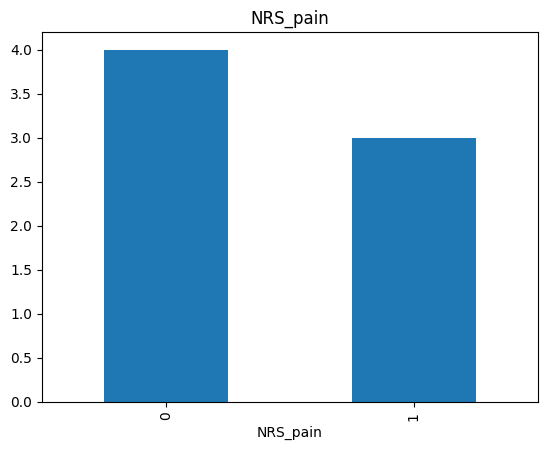

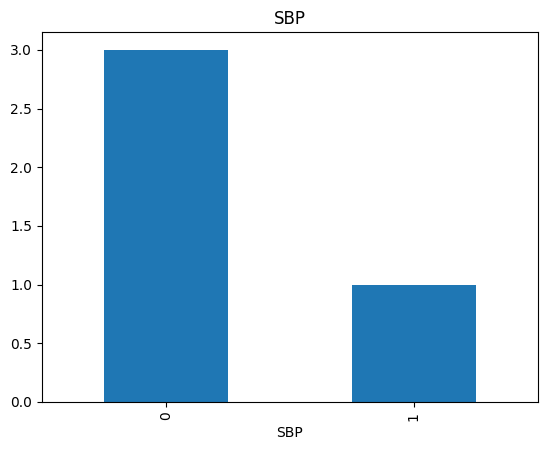

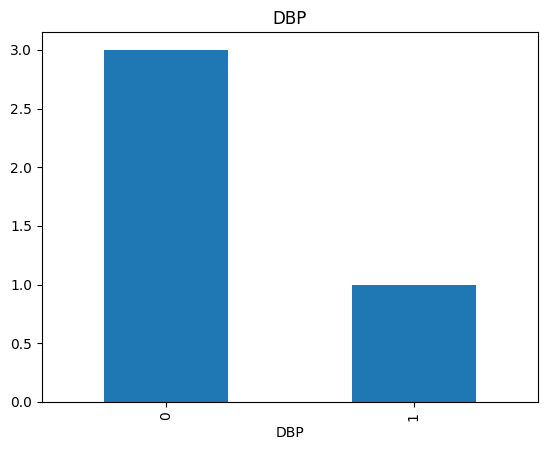

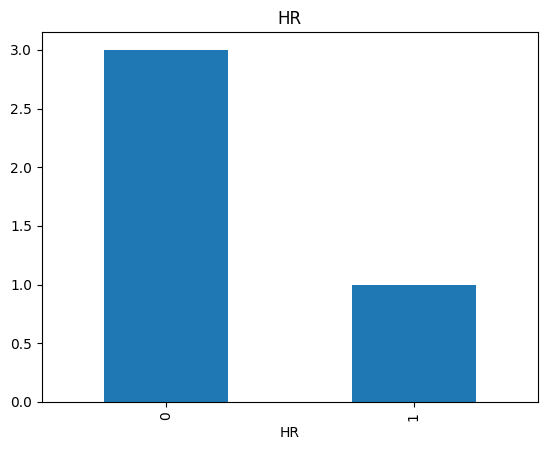

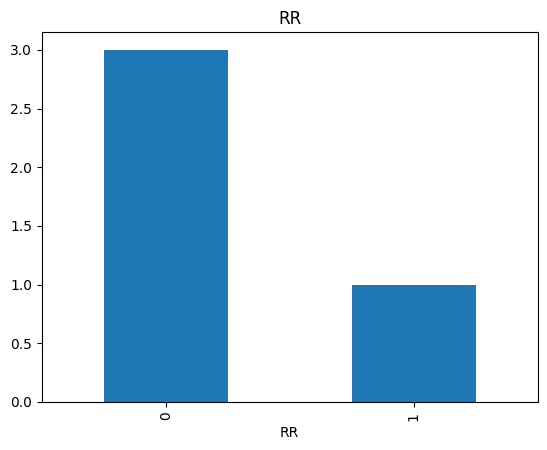

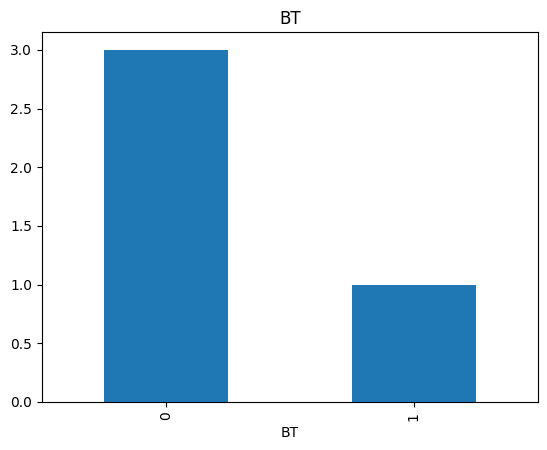

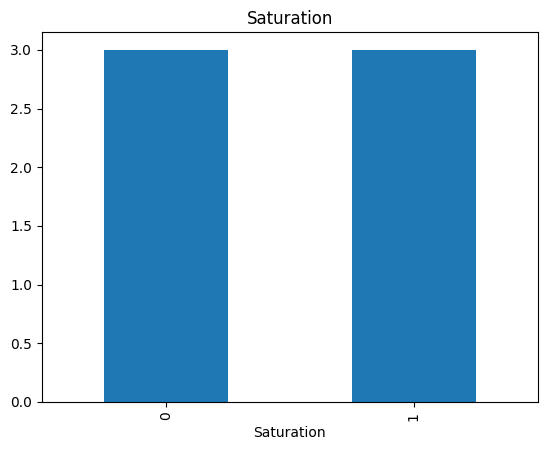

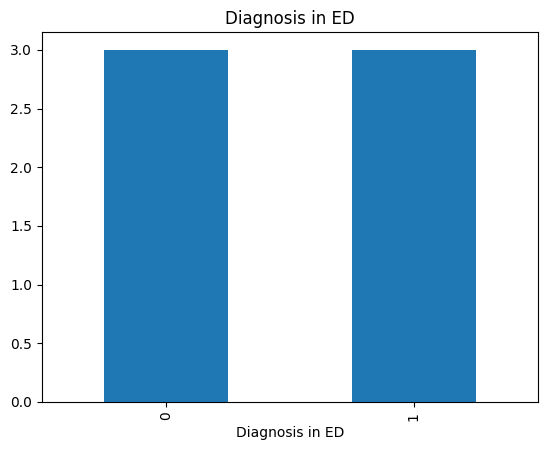

In [178]:
for features in feature_with_null_values:
    data = df_Emergency_join.copy()
    # let's create a variable indicate 1 if the value is missing or zero if the value is presenting
    data[features] = np.where(data[features].isnull(),1,0)
    # lets calculate the mean KTAS EXPERT  where the information is missing or information is present
    data.groupby(features)["KTAS_expert"].median().plot.bar()
    plt.title(features)
    plt.show()

In [179]:
df_Emergency_join["NRS_pain"] = df_Emergency_join["NRS_pain"].astype(float)
df_Emergency_join["NRS_pain"]= df_Emergency_join["NRS_pain"].fillna(df_Emergency_join["NRS_pain"].mean())   # nrs_pain distribution is look like normal so replace with mean


In [180]:
df_Emergency_join["NRS_pain"].isnull().sum()

np.int64(0)

In [181]:
df_Emergency_join['SBP'].unique()

array([160., 137., 130., 139.,  91., 140., 110., 169., 148., 141., 120.,
       121., 135., 100., 133., 124., 118.,  80., 180., 125., 162., 116.,
       152., 164., 196., 144., 150., 200., 113., 119., 156., 165., 132.,
        nan, 199., 138., 176., 170., 136., 194., 122., 214., 178., 108.,
        50., 145., 142., 210., 143.,  65., 129., 123., 158., 187.,  96.,
        70., 102., 161.,  90., 105., 190., 151., 134., 106., 149., 189.,
       197., 155., 131., 168., 166., 126., 115., 128., 114., 153., 117.,
       101., 159., 109., 157., 182., 111., 163., 167., 127., 147., 154.,
       112., 179., 191.,  93.,  98., 198., 204., 177., 195., 107., 171.,
       183., 146.,  95., 202., 174.,  86.,  94., 181.,  75., 211., 173.,
       193., 205.,  99., 275., 201., 103., 203., 104.,  79.,  60., 221.,
       233., 206.,  97., 220., 186., 213.])

## all the numerical variables

In [182]:
# list of all numerical feature
numeric_feature = [feature for feature in df_Emergency_join.columns if df_Emergency_join[feature].dtype !='O']  # make a varibale numerical feature using except dtypes object
numeric_feature

['Group',
 'Sex',
 'Age',
 'Patients number per hour',
 'Arrival mode',
 'Injury',
 'Mental',
 'Pain',
 'NRS_pain',
 'SBP',
 'DBP',
 'HR',
 'RR',
 'BT',
 'KTAS_RN',
 'Disposition',
 'KTAS_expert',
 'Error_group',
 'Length of stay_min',
 'KTAS duration_min']

In [183]:
len(numeric_feature)

20

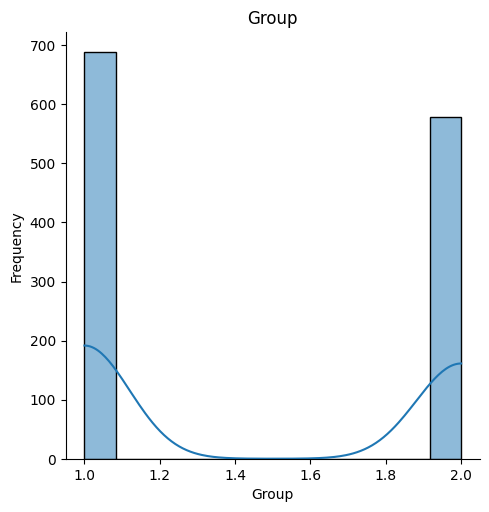

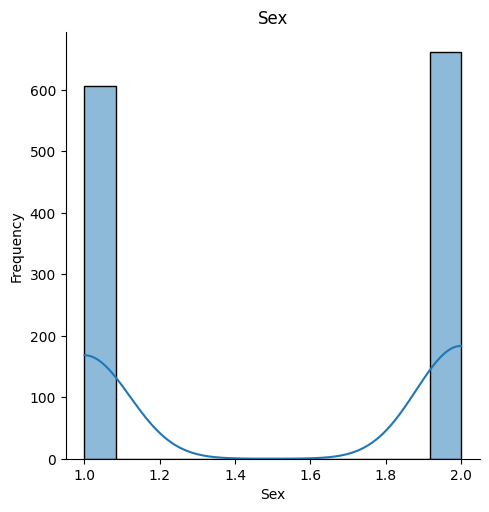

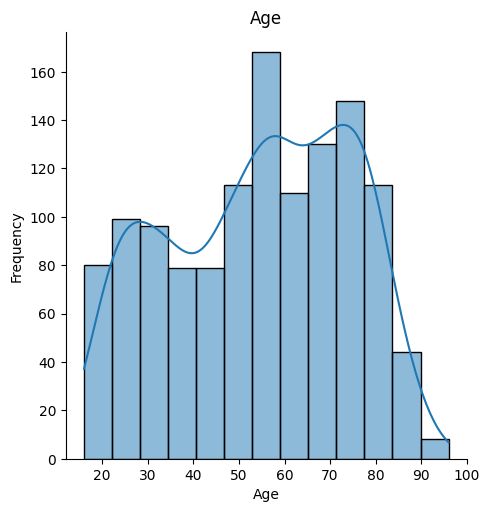

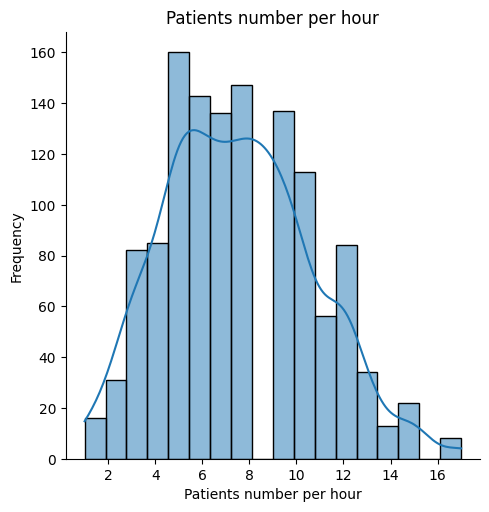

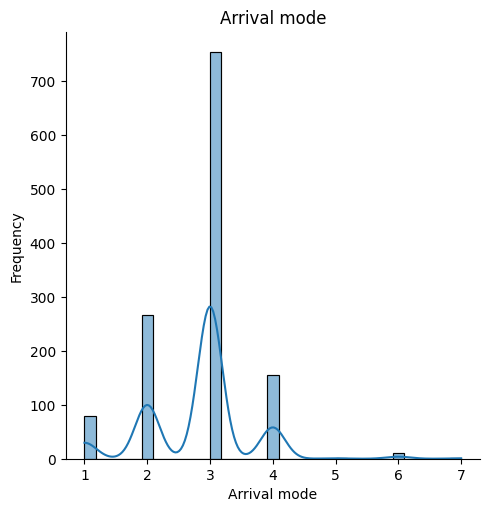

...

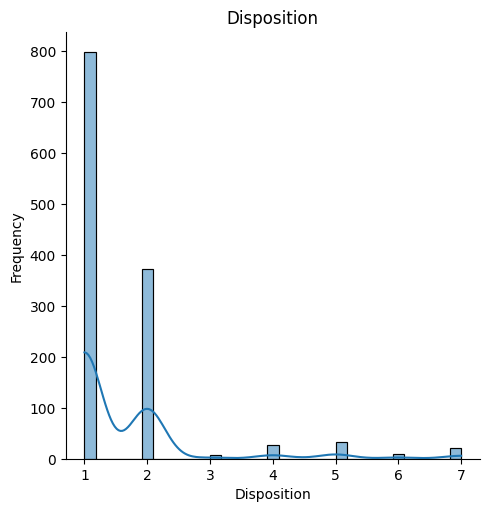

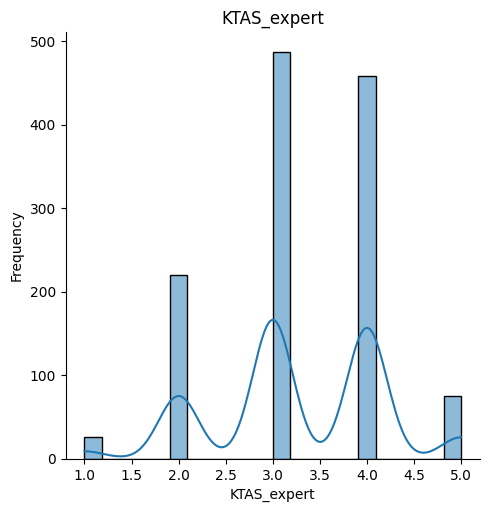

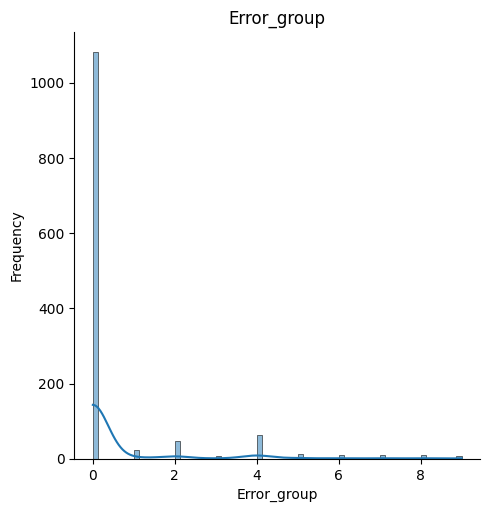

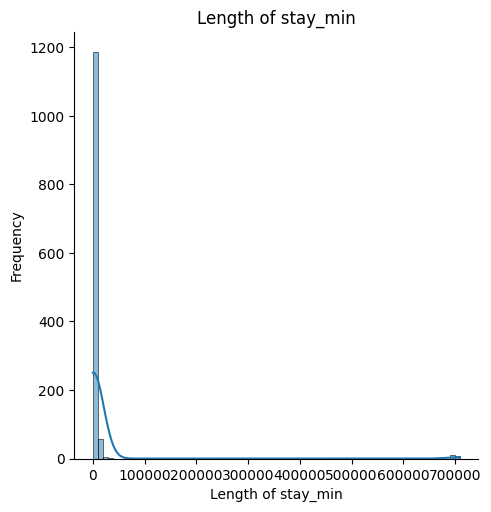

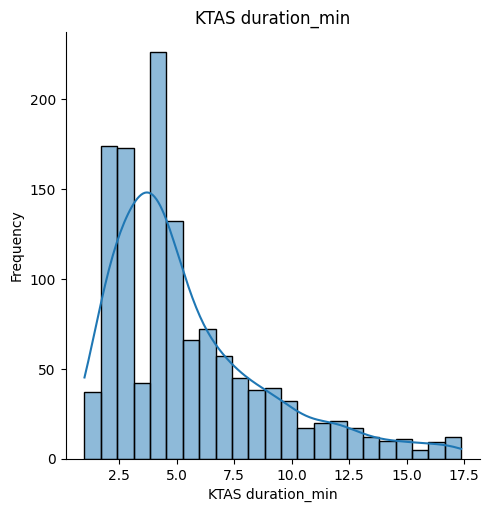

In [184]:
for feature in numeric_feature:    
    sns.displot(df_Emergency_join[feature], kde=True) # using a seaborn  each feature distribution 
    plt.title(f'{feature}')     # title for the graph
    plt.xlabel(feature)         # x axis label
    plt.ylabel('Frequency')     # y axis label
    plt.show()                  # show the graph

C:\Users\Khushal\AppData\Local\Temp\ipykernel_3916\4017179912.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_Emergency_join, x="KTAS_expert", y="NRS_pain", palette="muted", inner="box")


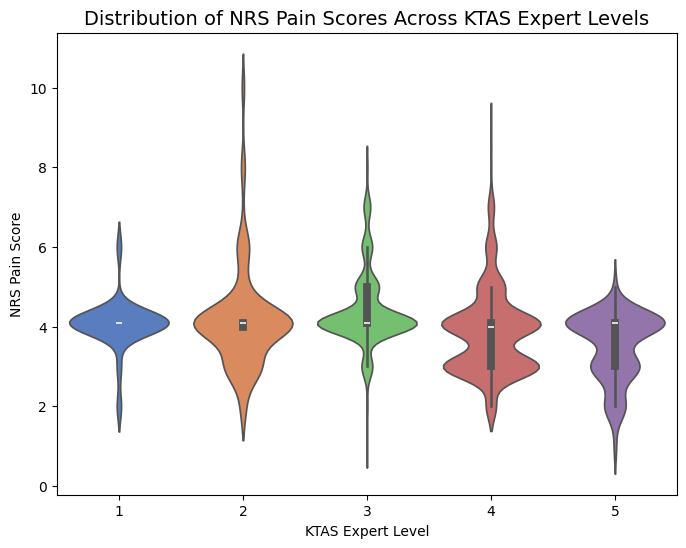

In [185]:

plt.figure(figsize=(8,6))
sns.violinplot(data=df_Emergency_join, x="KTAS_expert", y="NRS_pain", palette="muted", inner="box")
plt.title("Distribution of NRS Pain Scores Across KTAS Expert Levels", fontsize=14)
plt.xlabel("KTAS Expert Level")
plt.ylabel("NRS Pain Score")
plt.show()


violin plot shows that pain level is an important indicator of patient urgency higher pain scores are mostly seen in more severe triage levels but it is not the only factor determining the final KTAS expert classification.

In [186]:
df_Emergency_join["SBP"] =df_Emergency_join["SBP"].fillna(df_Emergency_join["SBP"].mean())  # Here SBP Feature graph look like normal we use mean

In [187]:
df_Emergency_join["DBP"] =df_Emergency_join["DBP"].fillna(float(df_Emergency_join["DBP"].mean())) # Here DBP Feature graph look like normal we use mean

df_Emergency_join["HR"] =df_Emergency_join["HR"].fillna(float(df_Emergency_join["HR"].mean())) # Here HR Feature graph look like normal we use mean
df_Emergency_join["RR"] =df_Emergency_join["RR"].fillna(float(20))   # here replace with highest class value because this is categorical feature
df_Emergency_join["BT"] =df_Emergency_join["BT"].fillna((df_Emergency_join["BT"].median()))  # right skewed distribution so replace with median

In [188]:
df_Emergency.isnull().sum() # now we have only 2 feature which has missing value

Group                         0
Sex                           0
Age                           0
Patients number per hour      0
Arrival mode                  0
Injury                        0
Chief_complain                0
Mental                        0
Pain                          0
NRS_pain                      0
SBP                           0
DBP                           0
HR                            0
RR                            0
BT                            0
Saturation                  697
KTAS_RN                       0
Diagnosis in ED               2
Disposition                   0
KTAS_expert                   0
Error_group                   0
Length of stay_min            0
KTAS duration_min             0
dtype: int64

## all the categorical variables

In [189]:
categorical_feature = [feature for feature in df_Emergency_join.columns if df_Emergency_join[feature].dtype =='O']   # check the no of object type
categorical_feature  

['Chief_complain', 'Saturation', 'Diagnosis in ED']

In [190]:
len(categorical_feature)

3

In [191]:
df_Emergency_join.head()

,Group,Sex,Age,Patients number per hour,Arrival mode,Injury,Chief_complain,Mental,Pain,NRS_pain,SBP,DBP,HR,RR,BT,Saturation,KTAS_RN,Diagnosis in ED,Disposition,KTAS_expert,Error_group,Length of stay_min,KTAS duration_min
0,2,2,71,3,3,2,right ocular pain,1,1,2.0,160.0,100.0,84.0,18.0,36.6,100,2,Corneal abrasion,1,4,2,86,5.00
1,1,1,56,12,3,2,right forearm burn,1,1,2.0,137.0,75.0,60.0,20.0,36.5,NaN,4,"Burn of hand, firts degree dorsum",1,5,4,64,3.95
2,2,1,68,8,2,2,"arm pain, Lt",1,1,2.0,130.0,80.0,102.0,20.0,36.6,98,4,"Fracture of surgical neck of humerus, closed",2,5,4,862,1.00
3,1,2,71,8,1,1,ascites tapping,1,1,3.0,139.0,94.0,88.0,20.0,36.5,NaN,4,Alcoholic liver cirrhosis with ascites,1,5,6,108,9.83
4,1,2,58,4,3,1,"distension, abd",1,1,3.0,91.0,67.0,93.0,18.0,36.5,NaN,4,Ascites,1,5,8,109,6.60


In [192]:
#df_Emergency_join['Saturation'].value_counts()

In [193]:
discreate_feature = [feature for feature in numeric_feature if len(df_Emergency_join[feature].unique())<25]  # We define that unique value is less than 25 we consider those are discreate_feature
discreate_feature

['Group',
 'Sex',
 'Patients number per hour',
 'Arrival mode',
 'Injury',
 'Mental',
 'Pain',
 'NRS_pain',
 'RR',
 'KTAS_RN',
 'Disposition',
 'KTAS_expert',
 'Error_group']

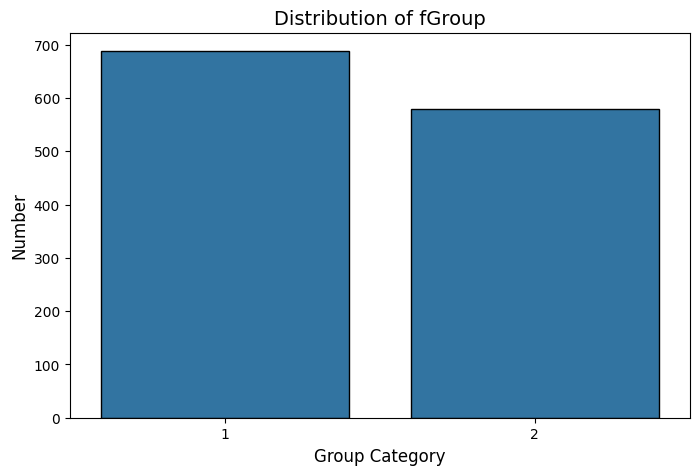

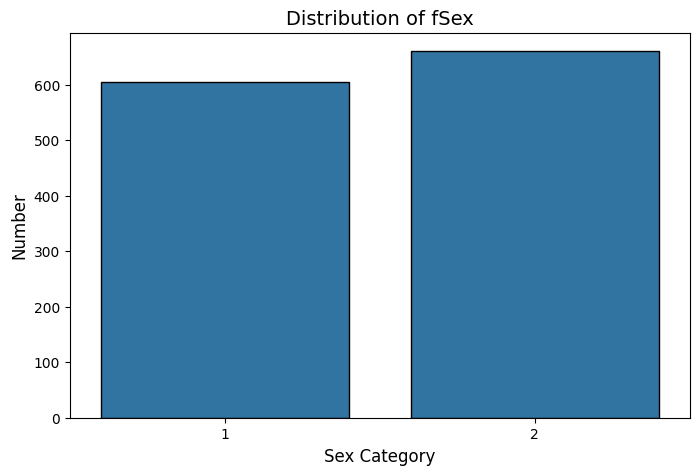

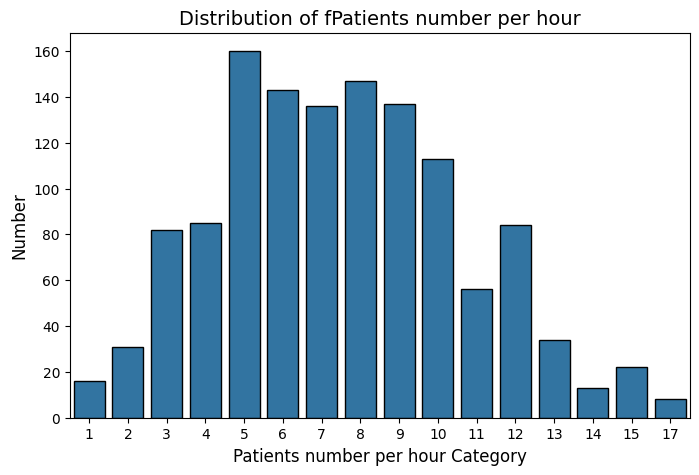

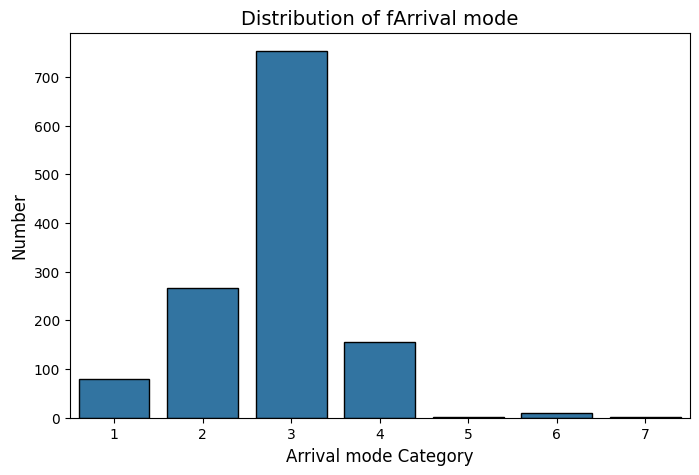

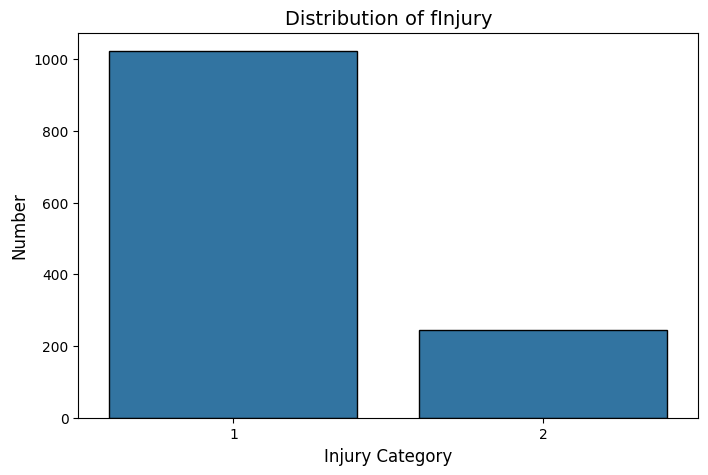

...

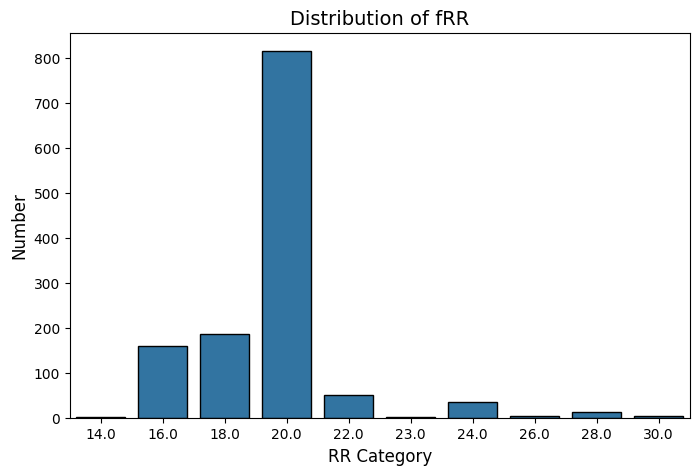

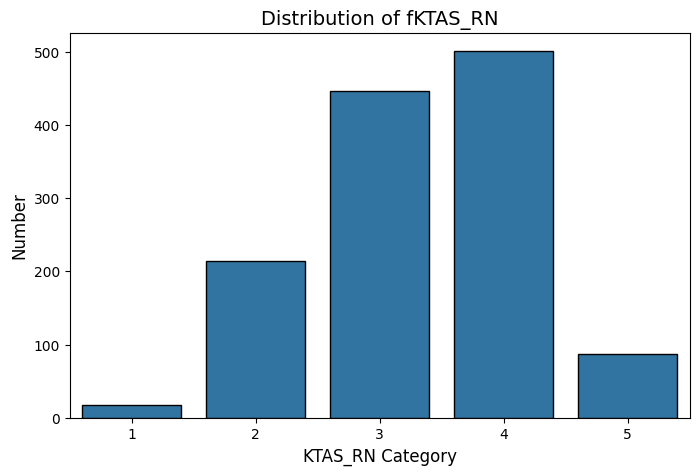

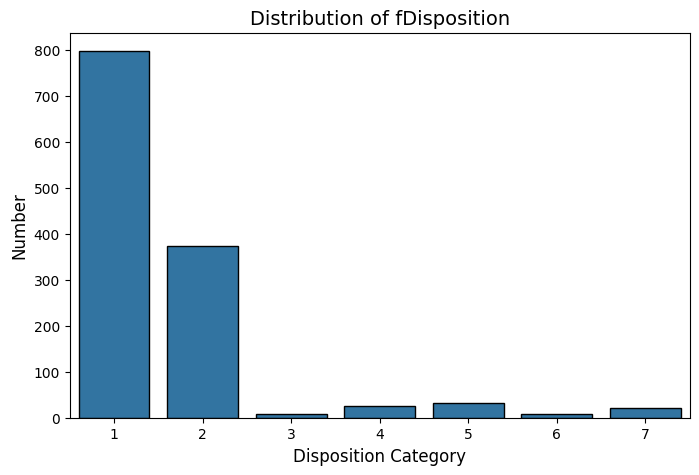

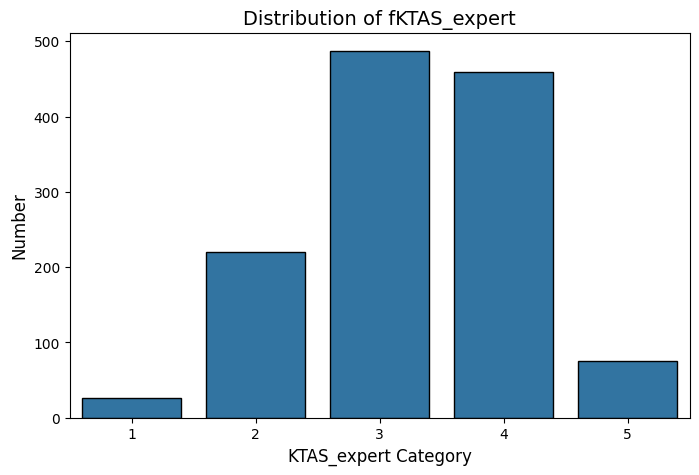

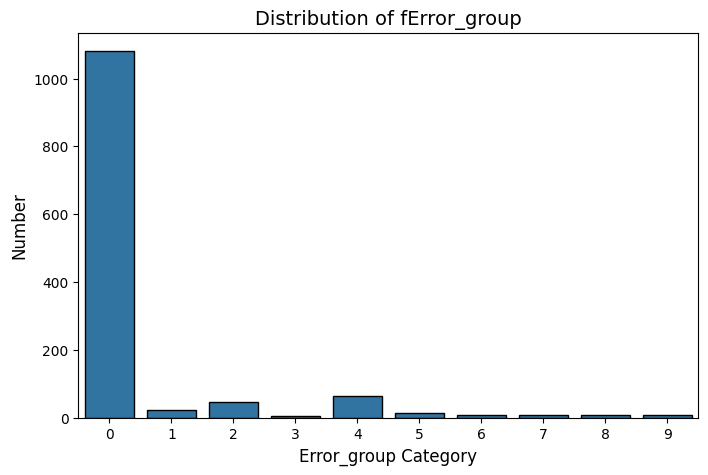

In [194]:
for feature in discreate_feature:  # using a for loop print a each feature graph
    plt.figure(figsize=(8,5))  # figure size
    sns.countplot(data=df_Emergency_join, x=feature, edgecolor="black")  # univariate analysis of each feature 
    plt.title(f"Distribution of f{feature}",fontsize=14)  
    plt.xlabel(f"{feature} Category", fontsize=12)
    plt.ylabel("Number", fontsize=12)
    plt.show()

# Bivariate analysis with dicreate features

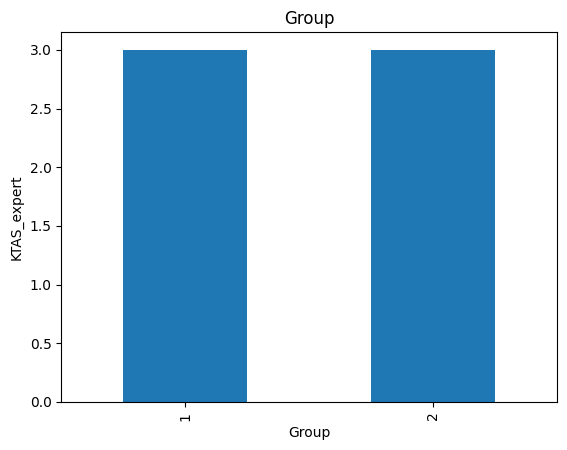

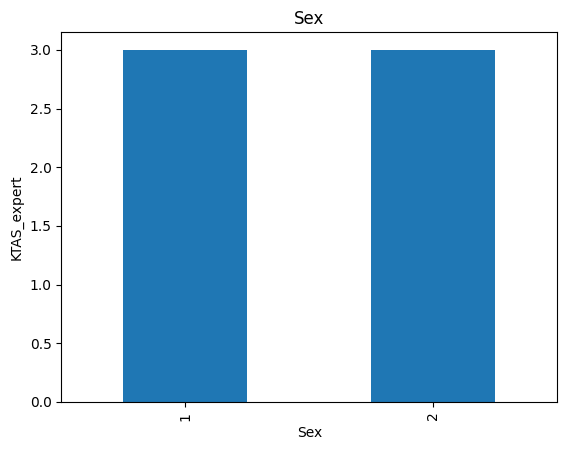

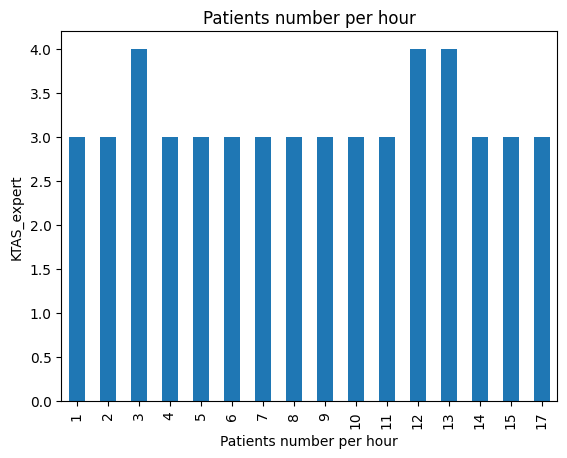

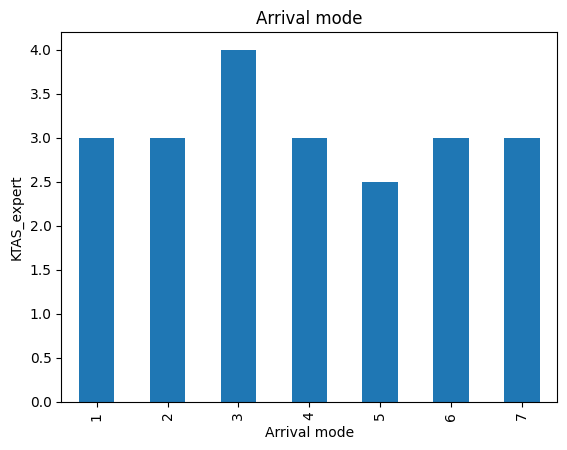

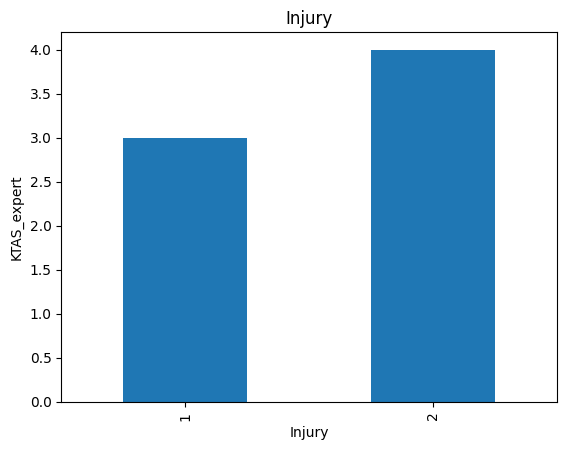

...

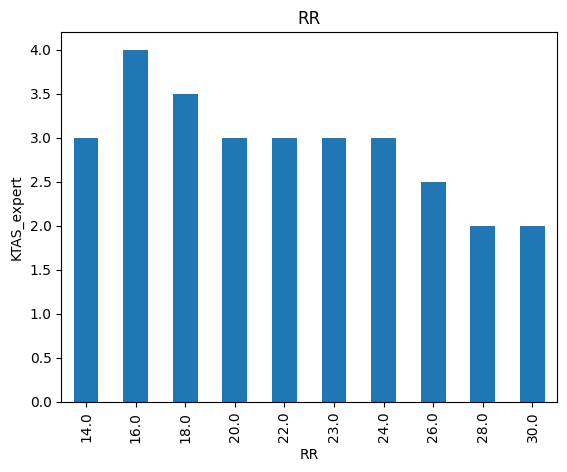

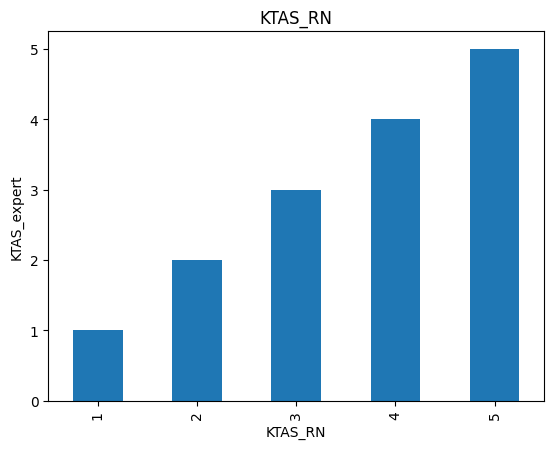

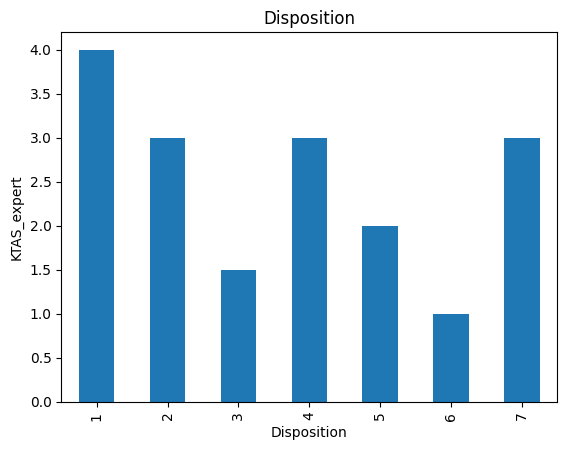

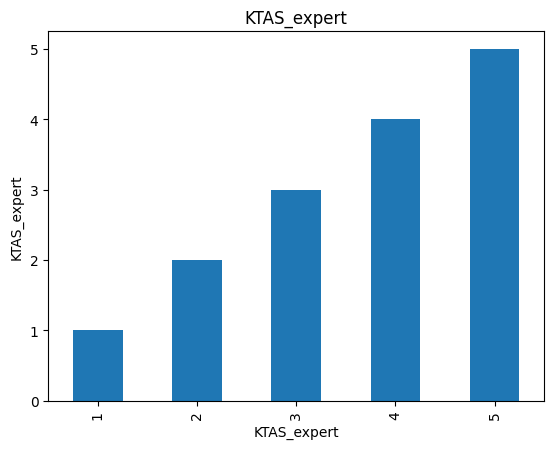

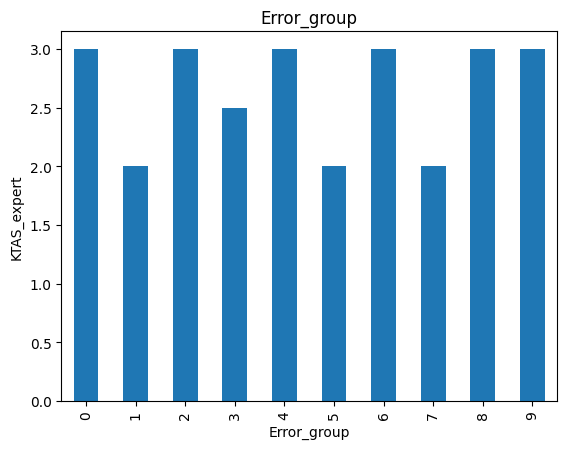

In [195]:
for feature in discreate_feature:
    data= df_Emergency_join.copy()
    data.groupby(feature)["KTAS_expert"].median().plot.bar()   # each discreate feature and target variable ktas_expert comparison
    plt.xlabel(feature)
    plt.ylabel("KTAS_expert")
    plt.title(feature)
    plt.show()

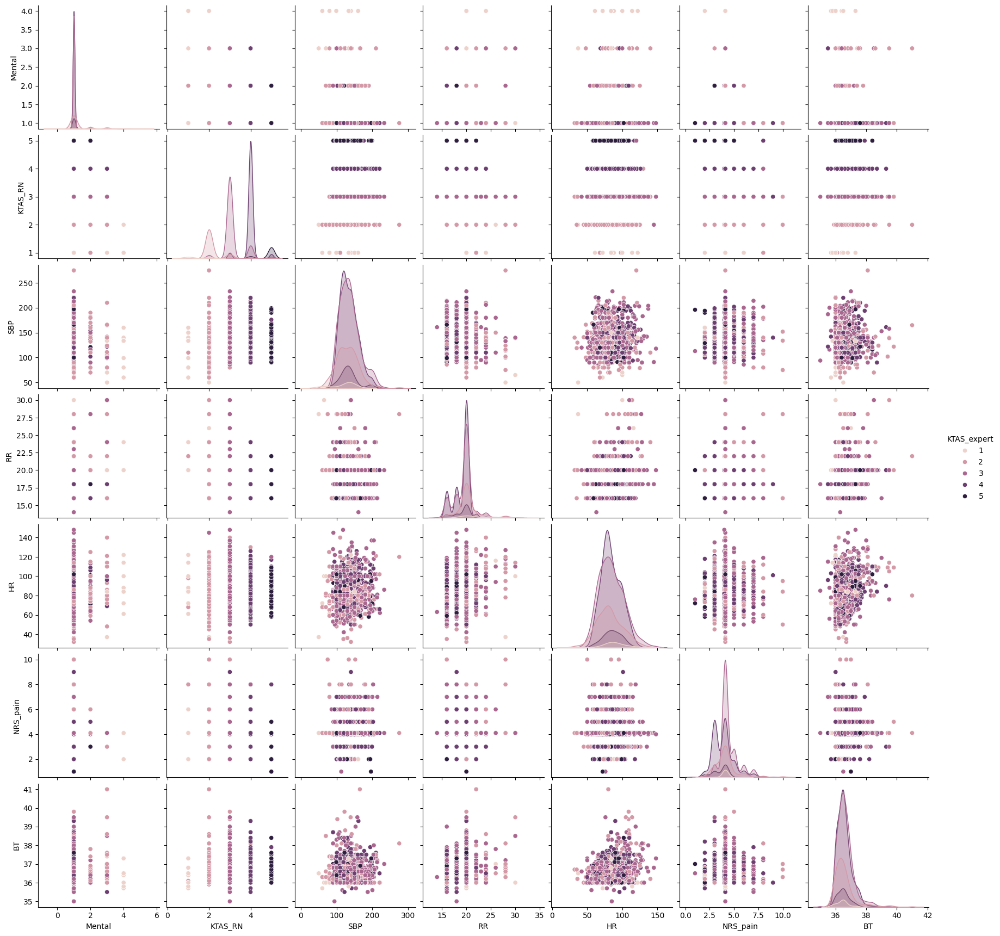

In [196]:
sns.pairplot(df_Emergency[['Mental','KTAS_RN','SBP','RR','HR','NRS_pain','BT','KTAS_expert']], hue="KTAS_expert")   # Pairplot of those 8 feature with target variable

In [197]:
## Bivariate analysis with continous features

In [198]:
continous_feature = [feature for feature in numeric_feature if len(df_Emergency_join[feature].unique())>25]  # which feature has more than 25 unique value consider as continous feature
continous_feature 

['Age', 'SBP', 'DBP', 'HR', 'BT', 'Length of stay_min', 'KTAS duration_min']

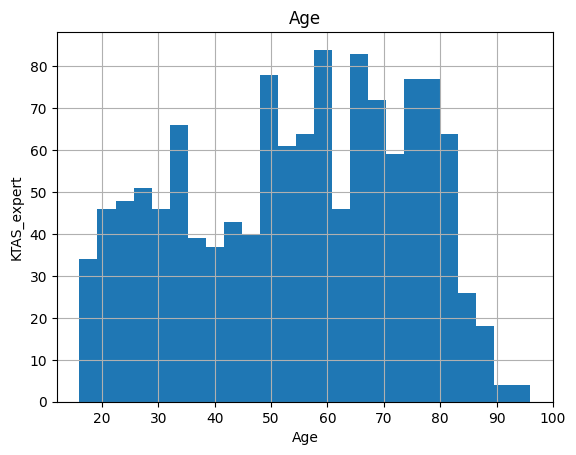

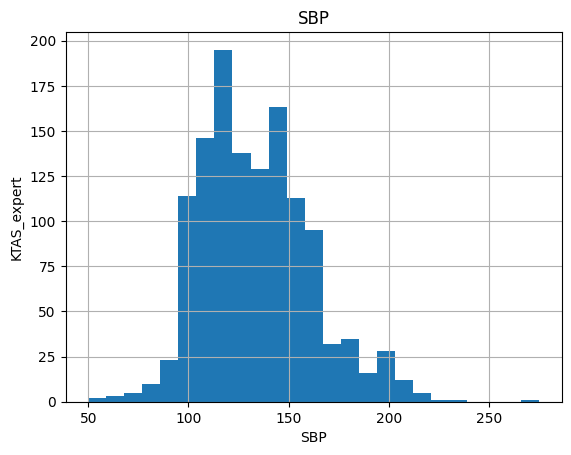

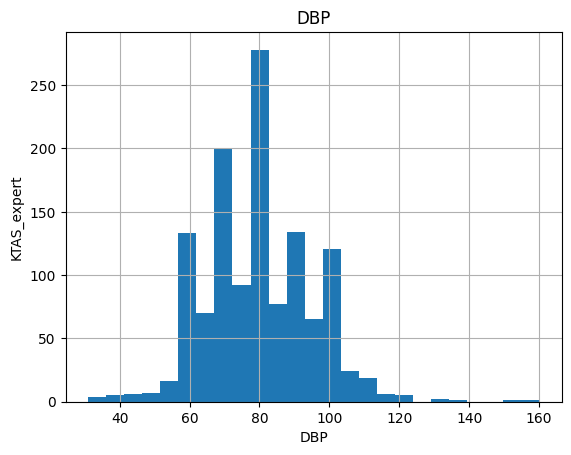

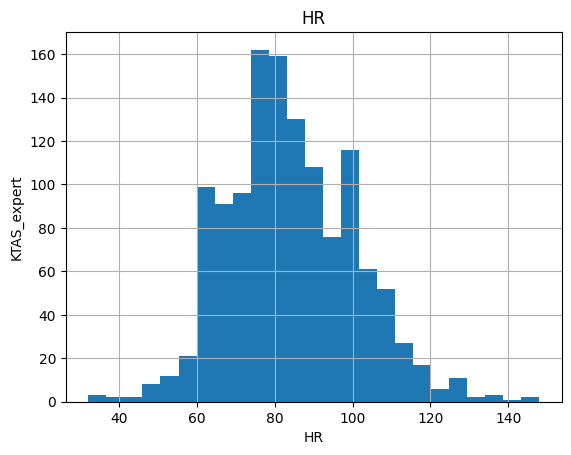

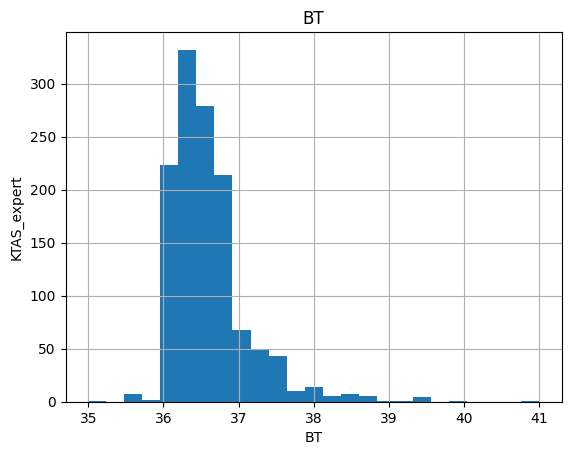

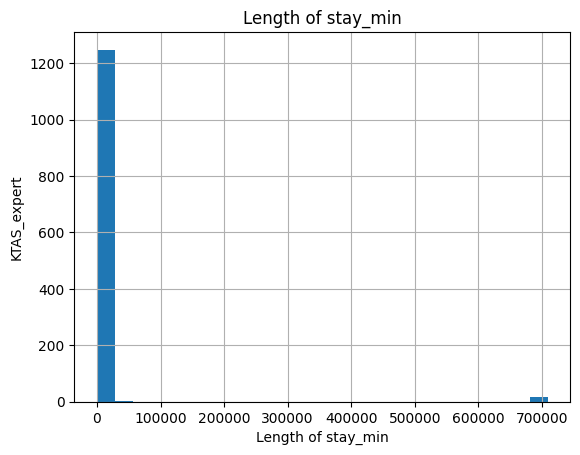

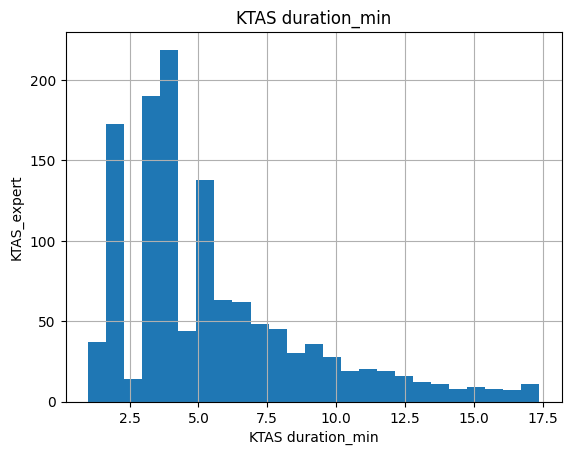

In [199]:


for feature in continous_feature:
    data= df_Emergency_join.copy()
    data[feature].hist(bins=25)       # plot a histograph for data distribution
    plt.xlabel(feature)
    plt.ylabel("KTAS_expert")
    plt.title(feature)
    plt.show()

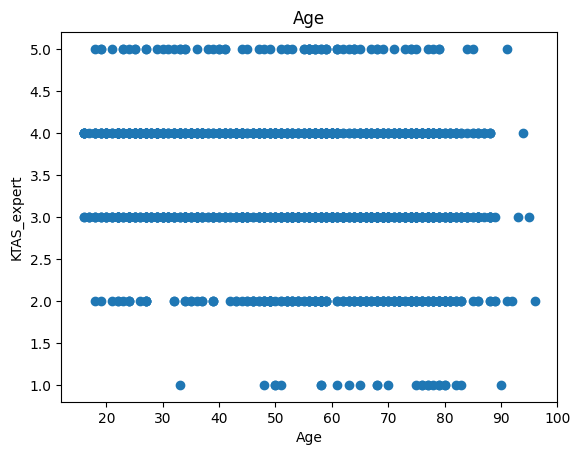

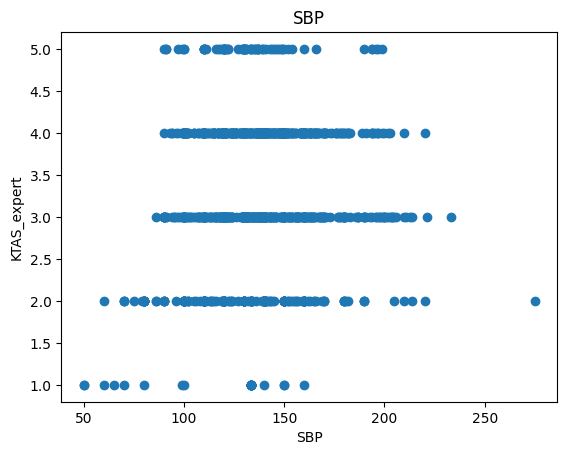

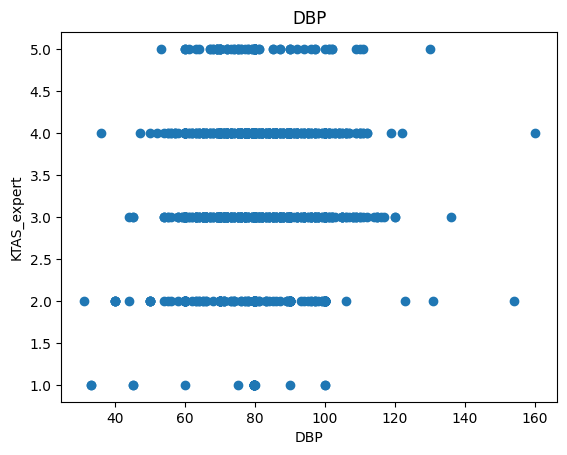

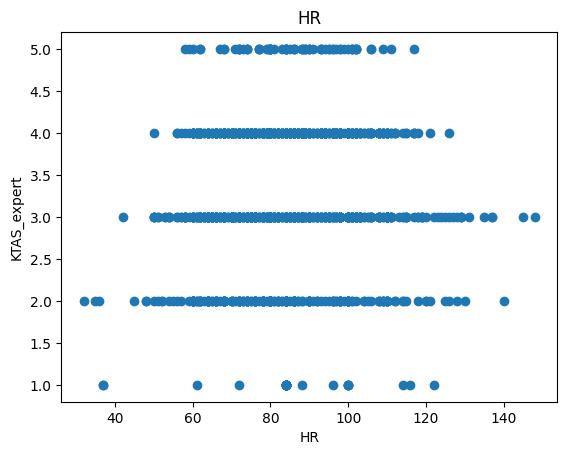

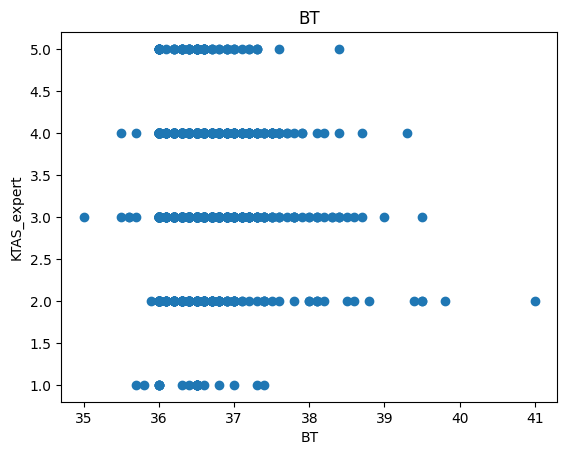

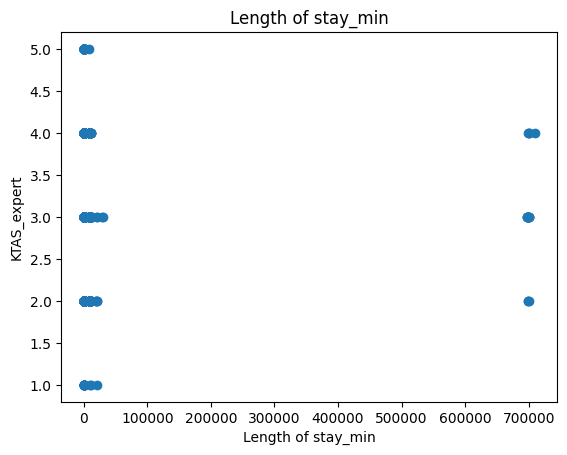

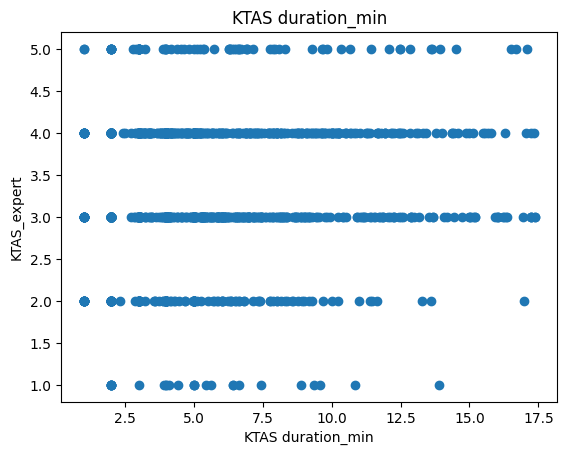

In [200]:
for feature in continous_feature:
    plt.scatter(data[feature] ,data["KTAS_expert"])  # scatter plot for feature and with target variable
    plt.xlabel(feature)
    plt.ylabel("KTAS_expert")
    plt.title(feature)
    plt.show()

In [201]:
df_Emergency_join['Length of stay_min'].dtypes

dtype('int64')

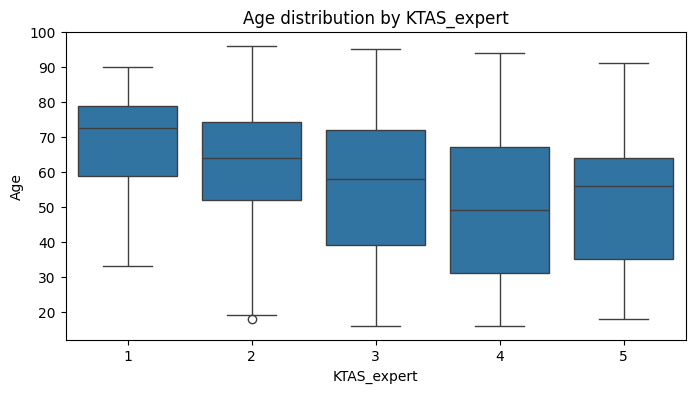

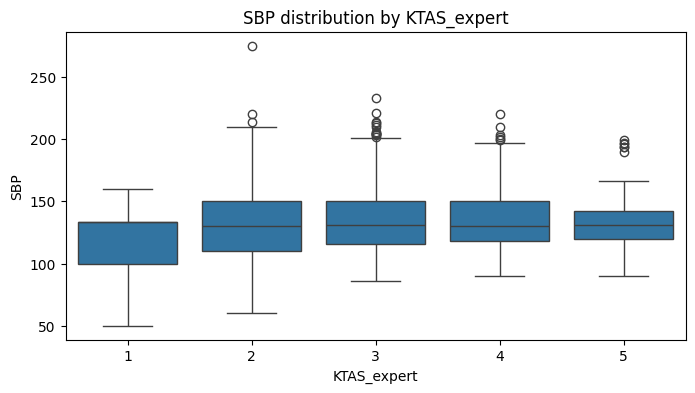

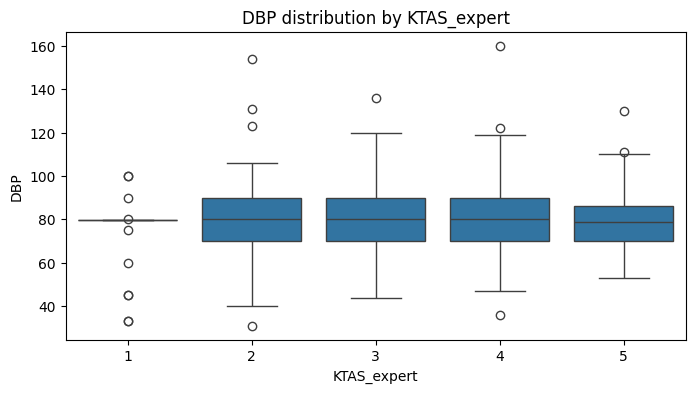

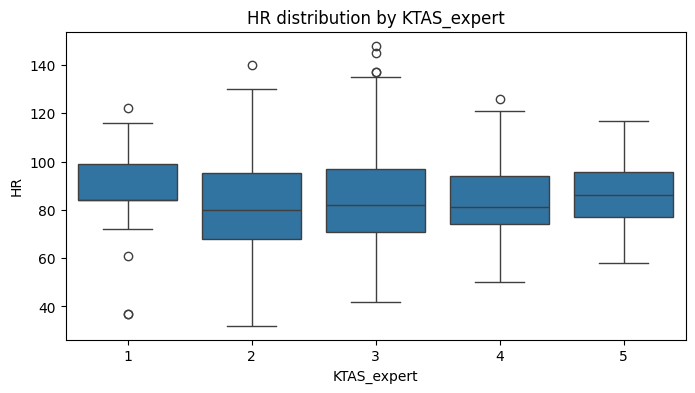

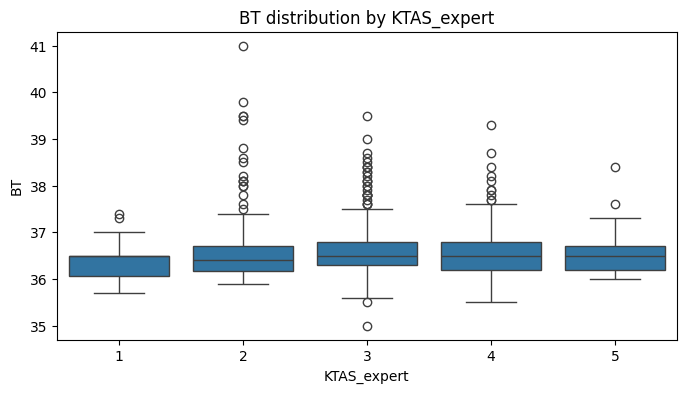

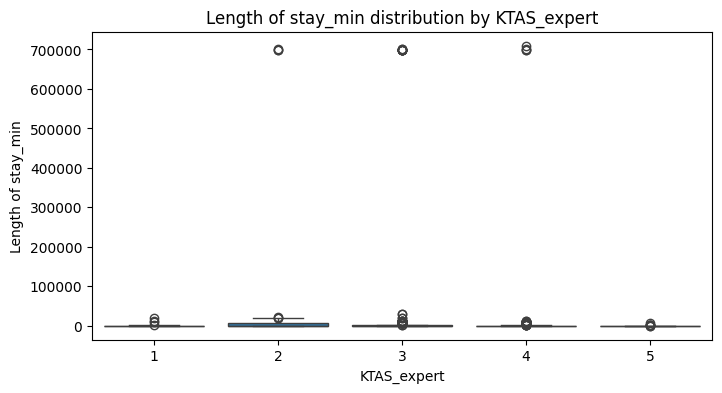

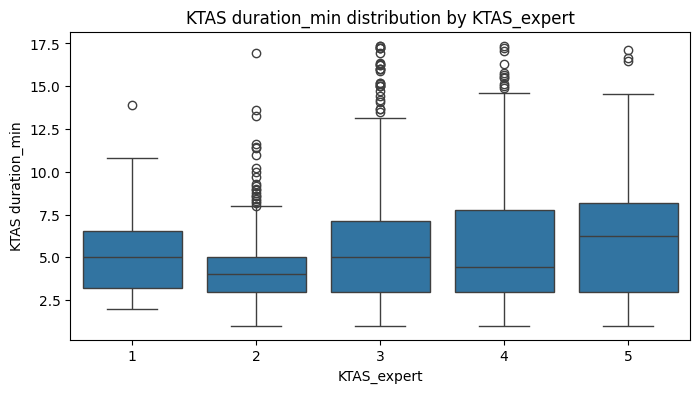

In [202]:

for feature in continous_feature:
    plt.figure(figsize=(8,4))
    sns.boxplot(x='KTAS_expert', y=feature, data=df_Emergency_join)  # boxplot , continous_feature with ktas expert
    plt.title(f"{feature} distribution by KTAS_expert")
    plt.xlabel("KTAS_expert")
    plt.ylabel(feature)
    plt.show()

In [203]:
df_Emergency_join["Saturation"].isnull().sum()   # Now we are dropping the columns but we also check the model accuarcy with filling a missing value.If we found a relation with target so we keep it 

np.int64(697)

In [204]:
import plotly.io as pio
pio.renderers.default = "notebook"

In [205]:
fig = px.scatter(df_Emergency_join, x="SBP", y="Age", color="KTAS_expert")
fig.show()

In [206]:
fig = px.scatter(df_Emergency_join, x="BT", y="NRS_pain", color="KTAS_expert")
fig.show()

In [207]:
fig = px.scatter(df_Emergency_join, x="BT", y="HR", color="KTAS_expert")
fig.show()

In [208]:
fig = px.scatter(df_Emergency_join, x="Mental", y="HR", color="KTAS_expert")
fig.show()

In [209]:
fig = px.scatter(df_Emergency_join, x="HR", y="NRS_pain", color="KTAS_expert")
fig.show()

In [210]:
#df_Emergency_join.drop(['Chief_complain','Diagnosis in ED'], axis=1, inplace=True)  # Chief_complain and 'Diagnosis in ED' feature has text data , if we want to use we need NLP

In [211]:
#corr = df_Emergency_join.corr()  # Here by default is pearson corelation 

In [212]:
#plt.figure(figsize=(12,6))  
#sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')   # using seaborn libary  plot heatmap which shows the relation with features

In [213]:
#corr1 = df_Emergency_join.corr(method='kendall')  # this is 2d corelation method
#corr1  

In [214]:
#plt.figure(figsize=(12,6))
#sns.heatmap(corr1, annot=True, cmap='coolwarm', fmt='.2f')   # heatmap for relation of variable

In [215]:
#corr2 = df_Emergency_join.corr(method='spearman')   # This is 3rd pearson corelation method
#corr2

df_Emergency_join.describe()

,Group,Sex,Age,Patients number per hour,Arrival mode,Injury,Mental,Pain,NRS_pain,SBP,DBP,HR,RR,BT,KTAS_RN,Disposition,KTAS_expert,Error_group,Length of stay_min,KTAS duration_min
count,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000,1267.000000
mean,1.456985,1.521705,54.423836,7.519337,2.820837,1.192581,1.105762,0.563536,4.104079,133.648953,79.780291,83.963111,19.515391,36.579479,3.335438,1.609313,3.265983,0.558011,11016.102605,5.497466
std,0.498343,0.499726,19.725033,3.160563,0.807904,0.394482,0.447768,0.496143,1.062910,27.004987,14.979719,16.512102,2.000089,0.541899,0.885391,1.157983,0.885803,1.571489,80446.092065,3.459470
min,1.000000,1.000000,16.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,50.000000,31.000000,32.000000,14.000000,35.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000
25%,1.000000,1.000000,37.000000,5.000000,2.000000,1.000000,1.000000,0.000000,3.000000,115.000000,70.000000,72.000000,18.000000,36.200000,3.000000,1.000000,3.000000,0.000000,133.000000,3.000000
50%,1.000000,2.000000,57.000000,7.000000,3.000000,1.000000,1.000000,1.000000,4.104079,130.000000,80.000000,82.000000,20.000000,36.500000,3.000000,1.000000,3.000000,0.000000,274.000000,4.280000
75%,2.000000,2.000000,71.000000,10.000000,3.000000,1.000000,1.000000,1.000000,4.104079,150.000000,90.000000,96.000000,20.000000,36.800000,4.000000,2.000000,4.000000,0.000000,606.500000,7.000000
max,2.000000,2.000000,96.000000,17.000000,7.000000,2.000000,4.000000,1.000000,10.000000,275.000000,160.000000,148.000000,30.000000,41.000000,5.000000,7.000000,5.000000,9.000000,709510.000000,17.370000


In [216]:
#plt.figure(figsize=(12,6))
#sns.heatmap(corr2, annot=True, cmap='coolwarm', fmt='.2f')

In [217]:
#  df_copy = df_Emergency[['Mental','KTAS_RN','SBP','RR','HR','NRS_pain','BT']] # Here top 8 important feature taken

In [218]:
df_Emergency_join.isnull().sum()

Group                         0
Sex                           0
Age                           0
Patients number per hour      0
Arrival mode                  0
Injury                        0
Chief_complain                0
Mental                        0
Pain                          0
NRS_pain                      0
SBP                           0
DBP                           0
HR                            0
RR                            0
BT                            0
Saturation                  697
KTAS_RN                       0
Diagnosis in ED               2
Disposition                   0
KTAS_expert                   0
Error_group                   0
Length of stay_min            0
KTAS duration_min             0
dtype: int64

In [219]:
# Cleaning the text feature  for nlp

df_Emergency_join.columns

Index(['Group', 'Sex', 'Age', 'Patients number per hour', 'Arrival mode',
       'Injury', 'Chief_complain', 'Mental', 'Pain', 'NRS_pain', 'SBP', 'DBP',
       'HR', 'RR', 'BT', 'Saturation', 'KTAS_RN', 'Diagnosis in ED',
       'Disposition', 'KTAS_expert', 'Error_group', 'Length of stay_min',
       'KTAS duration_min'],
      dtype='object')

In [220]:
df_Emergency_join["Chief_complain"].unique

<bound method Series.unique of 0                           right ocular pain
1                          right forearm burn
2                                arm pain, Lt
3                             ascites tapping
4                             distension, abd
5                                       fever
6                       With chest discomfort
7                                 pain, chest
8                         LBP - Low back pain
9                              Eczema, Eyelid
10                      acute epigastric pain
11                                  pain, leg
12                            epigastric pain
13                                   abd pain
14                                   headache
15                                   headache
16                                         ??
17                                 Open Wound
18                                   RUQ pain
19                          Gingival swelling
20                                  chin pain
21 

In [221]:
# clean the text

ps = PorterStemmer()
ls = WordNetLemmatizer()

stop_words = set(stopwords.words("english"))

negation_words = ["not", "no", "nor", "without"] # Remove negation words from stopwords beacuse i do not have chest pain
for word in negation_words:
    stop_words.discard(word)
print("not" in stop_words)

df_Emergency_join["Chief_complain"] = df_Emergency_join["Chief_complain"].replace(
    ["??", "#BOÞ!", ""], np.nan
)

# Fill missing with empty string
df_Emergency_join["Chief_complain"] = df_Emergency_join["Chief_complain"].fillna("")

clean_text = []
def clean_text_func(text):
    text = re.sub('[^a-zA-Z]', ' ', text)
    #print(text)
    text = text.lower()
    text = text.split()
    text =[ ls.lemmatize(word) for word in text if word not in stop_words]
    text = " ".join(text)
    clean_text.append(text)
    return text


df_Emergency_join["Chief_complain_clean"] = df_Emergency_join["Chief_complain"].apply(clean_text_func)

print(df_Emergency_join[["Chief_complain", "Chief_complain_clean"]].head(25))

False
             Chief_complain    Chief_complain_clean
0         right ocular pain       right ocular pain
1        right forearm burn      right forearm burn
2              arm pain, Lt             arm pain lt
3           ascites tapping         ascites tapping
4           distension, abd          distension abd
5                     fever                   fever
6     With chest discomfort        chest discomfort
7               pain, chest              pain chest
8       LBP - Low back pain       lbp low back pain
9            Eczema, Eyelid           eczema eyelid
10    acute epigastric pain   acute epigastric pain
11                pain, leg                pain leg
12          epigastric pain         epigastric pain
13                 abd pain                abd pain
14                 headache                headache
15                 headache                headache
16                                                 
17               Open Wound              open wound
18    

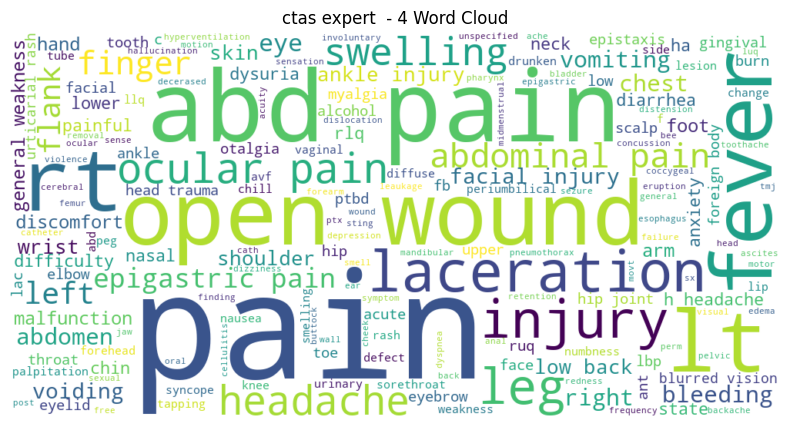

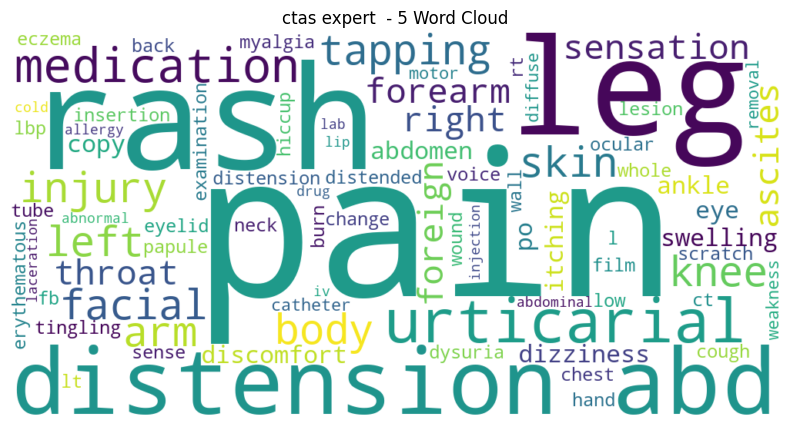

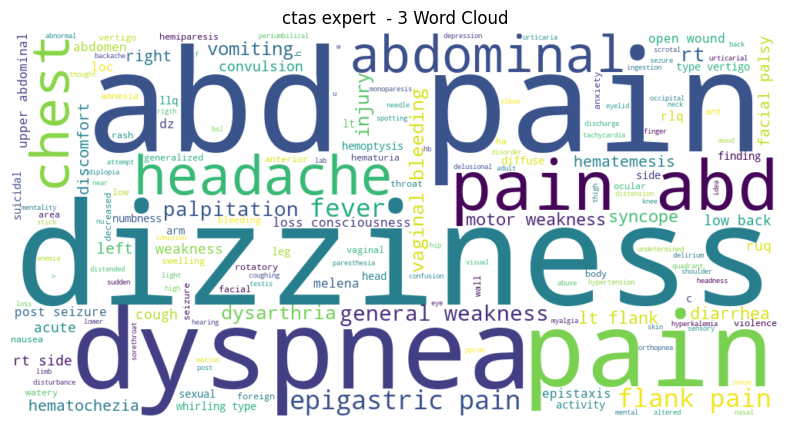

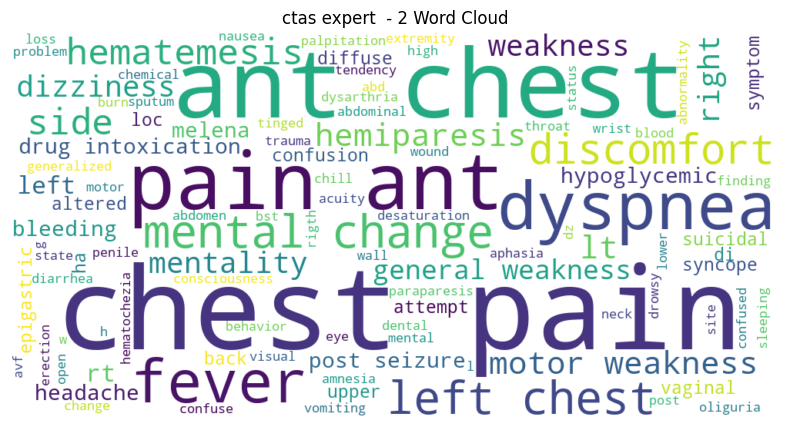

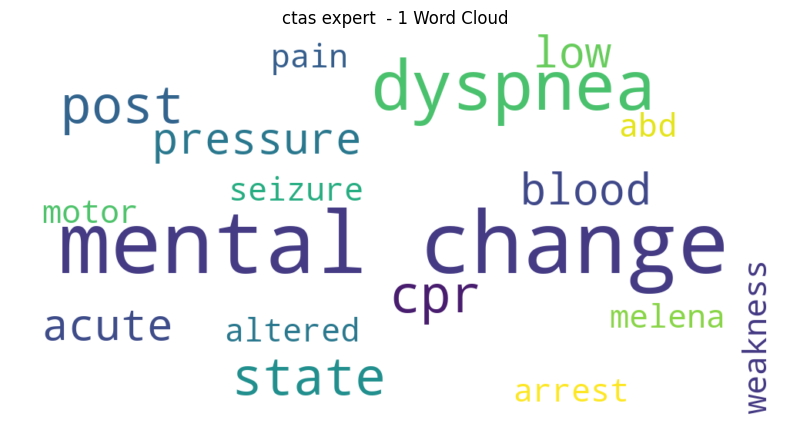

In [222]:
## word cloud for chief complain based on word
from wordcloud import WordCloud
def show_wordcloud(text_series, title):
    text = " ".join(text_series.dropna().astype(str))
    if text.strip():
        wc = WordCloud(width=1000, height=500, background_color="white").generate(text)
        plt.figure(figsize=(10,5))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(title)
        plt.show()


for KTAS_expert in df_Emergency_join["KTAS_expert"].unique():
    show_wordcloud(df_Emergency_join[df_Emergency_join["KTAS_expert"] == KTAS_expert]["Chief_complain_clean"], f"ctas expert  - {KTAS_expert} Word Cloud")



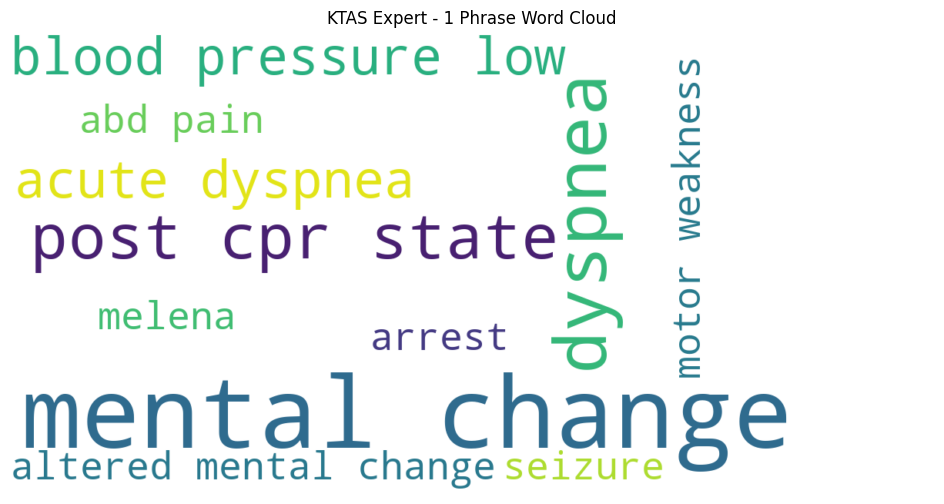

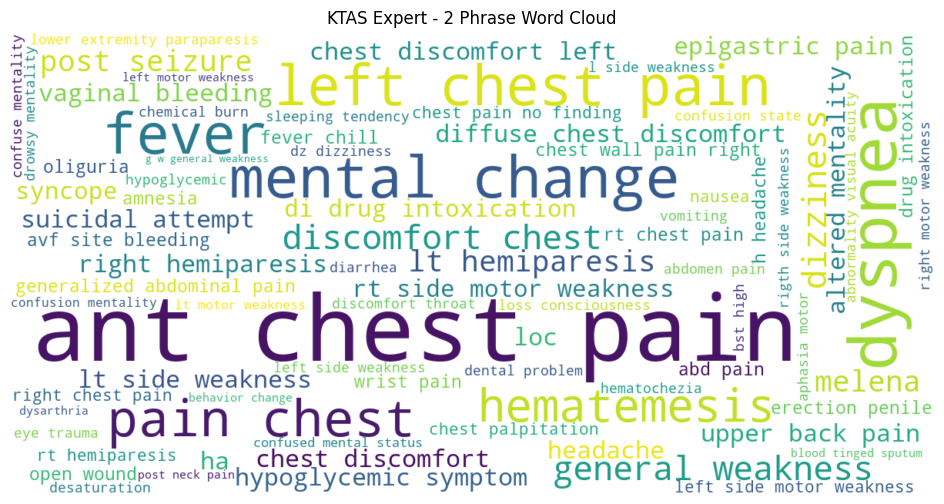

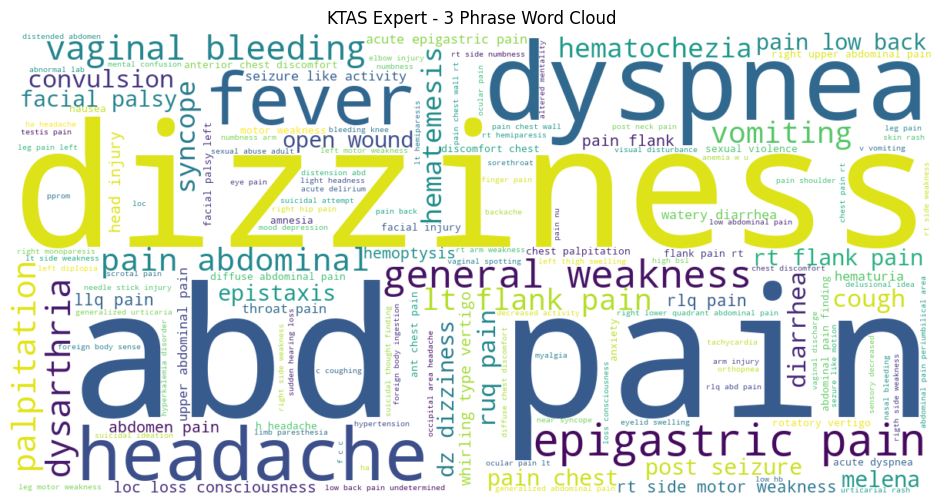

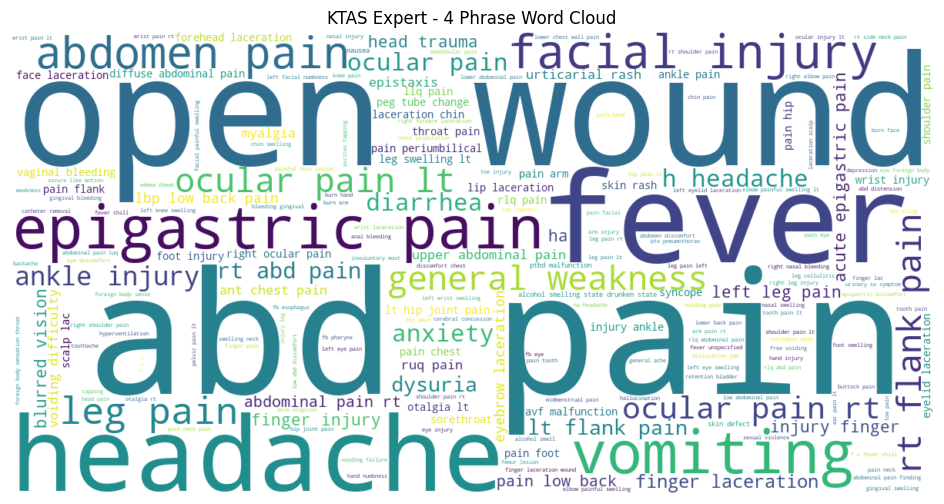

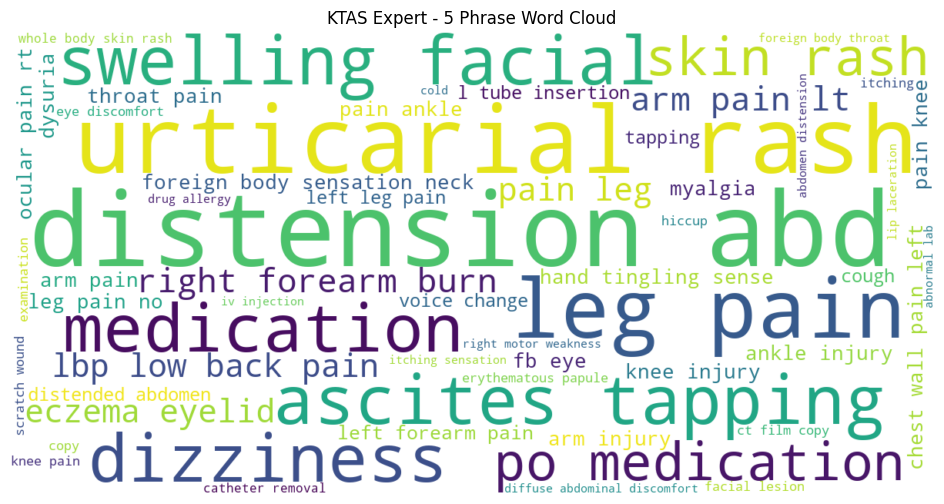

In [223]:
## word cloud for chief complain based on whole text in rows
from collections import Counter

def show_phrase_wordcloud(text_series, title):
    # Keep full phrase, not split into individual words
    phrases = text_series.dropna().astype(str).str.strip()
    phrases = phrases[phrases != ""]

    phrase_counts = Counter(phrases)

    if phrase_counts:
        wc = WordCloud(
            width=1200,
            height=600,
            background_color="white",
            collocations=False
        ).generate_from_frequencies(phrase_counts)

        plt.figure(figsize=(12, 6))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(title)
        plt.show()

for ktas in sorted(df_Emergency_join["KTAS_expert"].dropna().unique()):
    show_phrase_wordcloud(
        df_Emergency_join[df_Emergency_join["KTAS_expert"] == ktas]["Chief_complain_clean"],
        f"KTAS Expert - {ktas} Phrase Word Cloud"
    )

In [224]:
type(df_Emergency_join)
#df_Emergency_join[df_Emergency_join["KTAS_expert"] == 1]["cheif_complain_clean"]
print(len(df_Emergency_join[df_Emergency_join["KTAS_expert"] == 1]["Chief_complain_clean"]))
df_Emergency_join[df_Emergency_join["KTAS_expert"] == 1]["Chief_complain_clean"]

26


61                    dyspnea
121                   dyspnea
122        blood pressure low
123        blood pressure low
132                   dyspnea
133             acute dyspnea
150             mental change
153             mental change
155            motor weakness
161                    melena
164                   dyspnea
215             mental change
705                  abd pain
804             mental change
820             mental change
887                   seizure
968             mental change
1006           post cpr state
1009           post cpr state
1039                   arrest
1073            mental change
1078    altered mental change
1132            mental change
1143           post cpr state
1171            acute dyspnea
1192            mental change
Name: Chief_complain_clean, dtype: object

In [225]:
from collections import Counter
def top_words(text_series, top_n=15):
    all_words = " ".join(text_series.dropna().astype(str)).split()
    return Counter(all_words).most_common(top_n)

print("top words:")
print(top_words(df_Emergency_join["Chief_complain_clean"], 15))



top words:
[('pain', 414), ('chest', 102), ('abd', 99), ('dyspnea', 64), ('dizziness', 64), ('fever', 49), ('weakness', 49), ('rt', 45), ('ant', 44), ('injury', 43), ('lt', 41), ('headache', 40), ('left', 37), ('abdominal', 36), ('wound', 33)]


In [226]:
df_Emergency_join["Chief_complain_clean"].replace(" ", None).isnull().sum()
df_Emergency_join["Chief_complain_clean"].isnull().sum()

total_missing = (
    df_Emergency_join["Chief_complain_clean"].isnull() | 
    df_Emergency_join["Chief_complain_clean"].str.strip().eq("")
).sum()

print(f"Total missing values: {total_missing}")

Total missing values: 21


In [227]:
df_Emergency_join["Chief_complain_clean"] = df_Emergency_join["Chief_complain_clean"].str.strip().replace("", None)
total_missing = (
    df_Emergency_join["Chief_complain_clean"].isnull() | 
    df_Emergency_join["Chief_complain_clean"].str.strip().eq("None")
).sum()

print(f"Total missing values: {total_missing}")


Total missing values: 21


In [228]:
df_Emergency_join.dropna(subset=["Chief_complain_clean"], inplace=True)
total_missing = (
    df_Emergency_join["Chief_complain_clean"].isnull() | 
    df_Emergency_join["Chief_complain_clean"].str.strip().eq("None")
).sum()

print(f"Total missing values: {total_missing}")

df_Emergency_join.head(25)
df_Emergency_join = df_Emergency_join.reset_index(drop=True)


Total missing values: 0


In [229]:
#df_Emergency_join = df_Emergency_join.drop(index=[149,146,160])

In [230]:
df_Emergency_join.shape

(1246, 24)

In [231]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, accuracy_score

TEXT_COL = "Chief_complain_clean"
TARGET = "KTAS_expert"
TEXT_COL = "Chief_complain_clean"


In [232]:
TEXT_COL = "Chief_complain_clean"
TARGET = "KTAS_expert"

NUM_COLS = [c for c in ["SBP","DBP","HR","RR","BT","NRS_pain","Age"] if c in df_Emergency_join.columns]
CAT_COLS = [c for c in ["Sex","KTAS_RN"] if c in df_Emergency_join.columns]

X = df_Emergency_join[[TEXT_COL] + NUM_COLS + CAT_COLS].copy()
y = df_Emergency_join[TARGET].copy()


In [233]:
# make sure numeric cols are numeric
for c in NUM_COLS:
    X[c] = pd.to_numeric(X[c], errors="coerce")

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

In [234]:
from gensim.models import Word2Vec
from sklearn.base import BaseEstimator, TransformerMixin
class Word2VecTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, vector_size=100, window=5, min_count=1, workers=4):
        self.vector_size = vector_size
        self.window = window
        self.min_count = min_count
        self.workers = workers
        self.model = None

    def fit(self, X, y=None):
        # X may come as DataFrame
        texts = pd.Series(X.squeeze()).astype(str).fillna("")
        tokenized_texts = [word_tokenize(text.lower()) for text in texts]

        self.model = Word2Vec(
            sentences=tokenized_texts,
            vector_size=self.vector_size,
            window=self.window,
            min_count=self.min_count,
            workers=self.workers
        )
        return self

    def transform(self, X):
        texts = pd.Series(X.squeeze()).astype(str).fillna("")
        tokenized_texts = [word_tokenize(text.lower()) for text in texts]

        vectors = []
        for tokens in tokenized_texts:
            word_vectors = [self.model.wv[word] for word in tokens if word in self.model.wv]
            if len(word_vectors) > 0:
                vectors.append(np.mean(word_vectors, axis=0))
            else:
                vectors.append(np.zeros(self.vector_size))

        return np.array(vectors)

In [235]:
preprocess = ColumnTransformer(
    transformers=[
        ("text", Word2VecTransformer(vector_size=100, window=5, min_count=1), TEXT_COL),
        ("num", Pipeline([
           # ("imputer", SimpleImputer(strategy="median")),
            ("scaler", StandardScaler())
        ]), NUM_COLS),
        ("cat", Pipeline([
           # ("imputer", SimpleImputer(strategy="most_frequent")),
            ("onehot", OneHotEncoder(handle_unknown="ignore"))
        ]), CAT_COLS)
    ],
    remainder="drop"
)

In [236]:
df_Emergency_join[["SBP","DBP","HR","RR","BT","NRS_pain","Age"]].describe()

,SBP,DBP,HR,RR,BT,NRS_pain,Age
count,1246.000000,1246.000000,1246.000000,1246.000000,1246.000000,1246.000000,1246.000000
mean,133.564667,79.754292,83.945665,19.532905,36.580016,4.113826,54.434189
std,27.035108,14.971784,16.480324,1.994803,0.543004,1.065249,19.728073
min,50.000000,31.000000,32.000000,14.000000,35.000000,1.000000,16.000000
25%,114.000000,70.000000,72.000000,18.000000,36.200000,4.000000,37.000000
50%,130.000000,80.000000,82.000000,20.000000,36.500000,4.104079,57.000000
75%,150.000000,90.000000,95.000000,20.000000,36.800000,4.104079,71.000000
max,275.000000,160.000000,148.000000,30.000000,41.000000,10.000000,96.000000


In [237]:
model_results = []

# Every model result store in dataframe for record

In [238]:
import pandas as pd
from sklearn.metrics import accuracy_score, recall_score, f1_score

model_results = []

def evaluate_model(model_name, y_test, pred):
    
    acc = accuracy_score(y_test, pred)
    recall = recall_score(y_test, pred, average='macro')
    f1 = f1_score(y_test, pred, average='macro')

    model_results.append({
        "Model": model_name,
        "Accuracy": acc,
        "Macro Recall": recall,
        "Macro F1": f1
    })

In [239]:
# Decision tree classifier model

In [240]:


#from imblearn.over_sampling import SMOTE
#from imblearn.pipeline import Pipeline as ImbPipeline
#smote = SMOTE(random_state=42)
from sklearn.tree import DecisionTreeClassifier
from nltk.tokenize import word_tokenize
#from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
model_rf = Pipeline(steps=[
    ("preprocess", preprocess),
     #("smote", smote),
    #("clf", LinearSVC(class_weight="balanced", random_state=42))
    ("clf", DecisionTreeClassifier(
    criterion="gini",
    min_samples_split=20,
    min_samples_leaf=5,
    class_weight="balanced",
    random_state=42
))
    
])



model_rf.fit(X_train, y_train)
pred = model_rf.predict(X_test)

In [241]:
df_Emergency_join["KTAS_expert"].value_counts()
accuracy = accuracy_score(y_test, pred)

print("Train:", model_rf.score(X_train, y_train))
print("Test:", model_rf.score(X_test, y_test))
print("Accuracy:", accuracy)

Train: 0.8658256880733946
Test: 0.7700534759358288
Accuracy: 0.7700534759358288


In [242]:
print("Decision tree Accuracy:", accuracy_score(y_test, pred))
print(classification_report(y_test, pred))

Decision tree Accuracy: 0.7700534759358288
              precision    recall  f1-score   support

           1       0.38      0.75      0.50         8
           2       0.77      0.71      0.74        65
           3       0.84      0.82      0.83       145
           4       0.84      0.72      0.78       134
           5       0.48      0.91      0.62        22

    accuracy                           0.77       374
   macro avg       0.66      0.78      0.69       374
weighted avg       0.80      0.77      0.78       374



In [243]:
evaluate_model("Decision_tree", y_test, pred)

print(model_results)

[{'Model': 'Decision_tree', 'Accuracy': 0.7700534759358288, 'Macro Recall': 0.7822706937941113, 'Macro F1': 0.6944568596062572}]


In [244]:
# Random forest classifier model

In [245]:
#from imblearn.over_sampling import SMOTE
#from imblearn.pipeline import Pipeline as ImbPipeline
#smote = SMOTE(random_state=42)
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from nltk.tokenize import word_tokenize
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
model = Pipeline(steps=[
    ("preprocess", preprocess),
     #("smote", smote),
    #("clf", LinearSVC(class_weight="balanced", random_state=42))
    ("clf", RandomForestClassifier(
        n_estimators=300,  # this is the number of trees in the forest, 
        min_samples_split=20,
        min_samples_leaf=5,
        class_weight="balanced",
        random_state=42))
    
])



model.fit(X_train, y_train)
pred = model.predict(X_test)



# try logistic regression

In [246]:
import numpy as np
import pandas as pd

def predict_new_patient_tuned(model, patient_df, threshold_class_1=0.30, threshold_class_2=0.40):
    # class labels from trained classifier
    classes = model.named_steps["clf"].classes_
    class_to_index = {cls: idx for idx, cls in enumerate(classes)}

    idx1 = class_to_index[1]
    idx2 = class_to_index[2]

    # predict probabilities
    probs = model.predict_proba(patient_df)

    tuned_preds = []
    for row in probs:
        if row[idx1] >= threshold_class_1:
            tuned_preds.append(1)
        elif row[idx2] >= threshold_class_2:
            tuned_preds.append(2)
        else:
            tuned_preds.append(classes[np.argmax(row)])

    tuned_preds = np.array(tuned_preds)

    return tuned_preds, probs

In [247]:
new_patients = pd.DataFrame([
    {
    "Chief_complain_clean": "severe chest pain and collapse",
    "SBP": 70,      # VERY LOW
    "DBP": 40,
    "HR": 130,      # very high (compensation)
    "RR": 30,
    "BT": 36.0,
    "NRS_pain": 9,
    "Age": 60,
    "Sex": 1,
    "KTAS_RN": np.nan
}
])

In [248]:
preds, probs = predict_new_patient_tuned(
    model,
    new_patients,
    threshold_class_1=0.30,
    threshold_class_2=0.40
)

print("Final tuned prediction:", preds[0])
print("Class probabilities:", dict(zip(model.named_steps["clf"].classes_, probs[0])))

Final tuned prediction: 2
Class probabilities: {np.int64(1): np.float64(0.08989074784409945), np.int64(2): np.float64(0.42930567487542637), np.int64(3): np.float64(0.2130511023301486), np.int64(4): np.float64(0.2098830661018517), np.int64(5): np.float64(0.05786940884847382)}


In [249]:
preds, probs = predict_new_patient_tuned(
    model,
    new_patients,
    threshold_class_1=0.30,
    threshold_class_2=0.40
)

print("Final tuned prediction:", preds[0])
print("Class probabilities:", dict(zip(model.named_steps["clf"].classes_, probs[0])))

Final tuned prediction: 2
Class probabilities: {np.int64(1): np.float64(0.08989074784409945), np.int64(2): np.float64(0.42930567487542637), np.int64(3): np.float64(0.2130511023301486), np.int64(4): np.float64(0.2098830661018517), np.int64(5): np.float64(0.05786940884847382)}


In [250]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np
from sklearn.model_selection import StratifiedKFold, cross_validate


# Build pipeline

smote = SMOTE(random_state=42)

model = Pipeline(steps=[
    ("preprocess", preprocess),
    ("smote", smote),
    ("clf", RandomForestClassifier(
        n_estimators=300,
        min_samples_split=20,
        min_samples_leaf=5,
        class_weight={
            1: 7,
            2: 3,
            3: 1.5,
            4: 1,
            5: 1
        },
        random_state=42
    ))
])

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

cv_results = cross_validate(
    model,
    X_train,
    y_train,
    cv=cv,
    scoring={
        "accuracy": "accuracy",
        "f1_macro": "f1_macro",
        "recall_macro": "recall_macro"
    },
    return_train_score=True,
    n_jobs=1
)

print("Cross-Validation Results")
print("------------------------")
print("Train Accuracy Mean:", np.mean(cv_results["train_accuracy"]))
print("Validation Accuracy Mean:", np.mean(cv_results["test_accuracy"]))
print("Validation F1 Macro Mean:", np.mean(cv_results["test_f1_macro"]))
print("Validation Recall Macro Mean:", np.mean(cv_results["test_recall_macro"]))

print("\nFold-wise Validation Accuracy:", cv_results["test_accuracy"])
print("Fold-wise Validation F1 Macro:", cv_results["test_f1_macro"])
print("Fold-wise Validation Recall Macro:", cv_results["test_recall_macro"])
# Train model

model.fit(X_train, y_train)


# Default prediction

pred_default = model.predict(X_test)
print("Default Accuracy:", accuracy_score(y_test, pred_default))
print("Default Confusion Matrix:\n", confusion_matrix(y_test, pred_default))
print("Default Classification Report:\n", classification_report(y_test, pred_default))


# Get probabilities

probs = model.predict_proba(X_test)

# class labels order used by the classifier
classes = model.named_steps["clf"].classes_
print("Classes:", classes)

# map class label to probability column index
class_to_index = {cls: idx for idx, cls in enumerate(classes)}

idx1 = class_to_index[1]
idx2 = class_to_index[2]
idx3 = class_to_index[3]

# Threshold tuning

threshold_class_1 = 0.30      # if i use weight 0.25 so which make recall class 1
threshold_class_2 = 0.40     # but for balance scenario little drop can be acceptable 
#threshold_class_3 = 0.37

pred_threshold = []

for row in probs:
    if row[idx1] >= threshold_class_1:
        pred_threshold.append(1)
    elif row[idx2] >= threshold_class_2:
        pred_threshold.append(2)
    # elif row[idx3] >= threshold_class_3:
    #     pred_threshold.append(3)
    else:
        pred_threshold.append(classes[np.argmax(row)])

pred_threshold = np.array(pred_threshold)

#
# Evaluation after threshold tuning
# 
print("Threshold-Tuned Accuracy:", accuracy_score(y_test, pred_threshold))
print("Threshold-Tuned Confusion Matrix:\n", confusion_matrix(y_test, pred_threshold))
print("Threshold-Tuned Classification Report:\n", classification_report(y_test, pred_threshold))



Cross-Validation Results
------------------------
Train Accuracy Mean: 0.8787225645726877
Validation Accuracy Mean: 0.7867257799671592
Validation F1 Macro Mean: 0.7321293268736146
Validation Recall Macro Mean: 0.7761977333324015

Fold-wise Validation Accuracy: [0.76571429 0.78285714 0.75862069 0.82758621 0.79885057]
Fold-wise Validation F1 Macro: [0.69512856 0.74518365 0.68041817 0.78472222 0.75519403]
Fold-wise Validation Recall Macro: [0.71108354 0.78580645 0.74418722 0.83990512 0.80000633]
Default Accuracy: 0.8502673796791443
Default Confusion Matrix:
 [[  6   2   0   0   0]
 [  4  53   4   3   1]
 [  0   9 123   8   5]
 [  0   2  11 117   4]
 [  0   0   0   3  19]]
Default Classification Report:
               precision    recall  f1-score   support

           1       0.60      0.75      0.67         8
           2       0.80      0.82      0.81        65
           3       0.89      0.85      0.87       145
           4       0.89      0.87      0.88       134
           5       

In [251]:
available_cols = [col for col in df_Emergency_join if col in X_test.columns]

# create output dataframe
output_df = X_test[available_cols].copy().reset_index(drop=True)
output_df["Actual_Class"] = pd.Series(y_test).reset_index(drop=True)
output_df["Pred_Default"] = pred_default
output_df["Pred_Threshold"] = pred_threshold

# save csv
#output_df.to_csv("prediction_results_with_vitals.csv", index=False, encoding="utf-8-sig")

In [252]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, roc_auc_score


# ROC and AUC for multiclass


# Binarize the true labels
# classes should already be [1, 2, 3, 4, 5]
y_test_bin = label_binarize(y_test, classes=classes)

# probs shape should be (n_samples, n_classes)
print("y_test_bin shape:", y_test_bin.shape)
print("probs shape:", probs.shape)

# Store ROC info
fpr = {}
tpr = {}
roc_auc = {}

# Compute ROC curve and AUC for each class
for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], probs[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])

# Micro-average ROC and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Macro-average AUC
macro_auc_ovr = roc_auc_score(
    y_test_bin,
    probs,
    multi_class="ovr",
    average="macro"
)

weighted_auc_ovr = roc_auc_score(
    y_test_bin,
    probs,
    multi_class="ovr",
    average="weighted"
)

print("\nAUC Scores")
print("-----------")
for cls in classes:
    print(f"Class {cls} AUC: {roc_auc[cls]:.4f}")

print(f"Micro-average AUC: {roc_auc['micro']:.4f}")
print(f"Macro-average AUC (OvR): {macro_auc_ovr:.4f}")
print(f"Weighted-average AUC (OvR): {weighted_auc_ovr:.4f}")

y_test_bin shape: (374, 5)
probs shape: (374, 5)

AUC Scores
-----------
Class 1 AUC: 0.9932
Class 2 AUC: 0.9332
Class 3 AUC: 0.9447
Class 4 AUC: 0.9657
Class 5 AUC: 0.9728
Micro-average AUC: 0.9662
Macro-average AUC (OvR): 0.9619
Weighted-average AUC (OvR): 0.9529


In [253]:

#  Get class labels

classes = model.named_steps["clf"].classes_
print("Classes:", classes)


# Binarize y_test

y_test_bin = label_binarize(y_test, classes=classes)

print("Shape of y_test_bin:", y_test_bin.shape)
print("Shape of probs:", probs.shape)


# ROC + AUC for each class

fpr = {}
tpr = {}
roc_auc = {}

for i, cls in enumerate(classes):
    fpr[cls], tpr[cls], _ = roc_curve(y_test_bin[:, i], probs[:, i])
    roc_auc[cls] = auc(fpr[cls], tpr[cls])


#  Micro-average ROC + AUC

fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), probs.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

Classes: [1 2 3 4 5]
Shape of y_test_bin: (374, 5)
Shape of probs: (374, 5)


In [254]:

# Macro and weighted AUC

macro_auc = roc_auc_score(
    y_test_bin,
    probs,
    multi_class="ovr",
    average="macro"
)

weighted_auc = roc_auc_score(
    y_test_bin,
    probs,
    multi_class="ovr",
    average="weighted"
)

In [255]:
#  Print AUC values

print("\nROC-AUC Scores")
print("-------------------")
for cls in classes:
    print(f"Class {cls} AUC: {roc_auc[cls]:.4f}")

print(f"Micro-average AUC: {roc_auc['micro']:.4f}")
print(f"Macro-average AUC: {macro_auc:.4f}")
print(f"Weighted-average AUC: {weighted_auc:.4f}")


ROC-AUC Scores
-------------------
Class 1 AUC: 0.9932
Class 2 AUC: 0.9332
Class 3 AUC: 0.9447
Class 4 AUC: 0.9657
Class 5 AUC: 0.9728
Micro-average AUC: 0.9662
Macro-average AUC: 0.9619
Weighted-average AUC: 0.9529


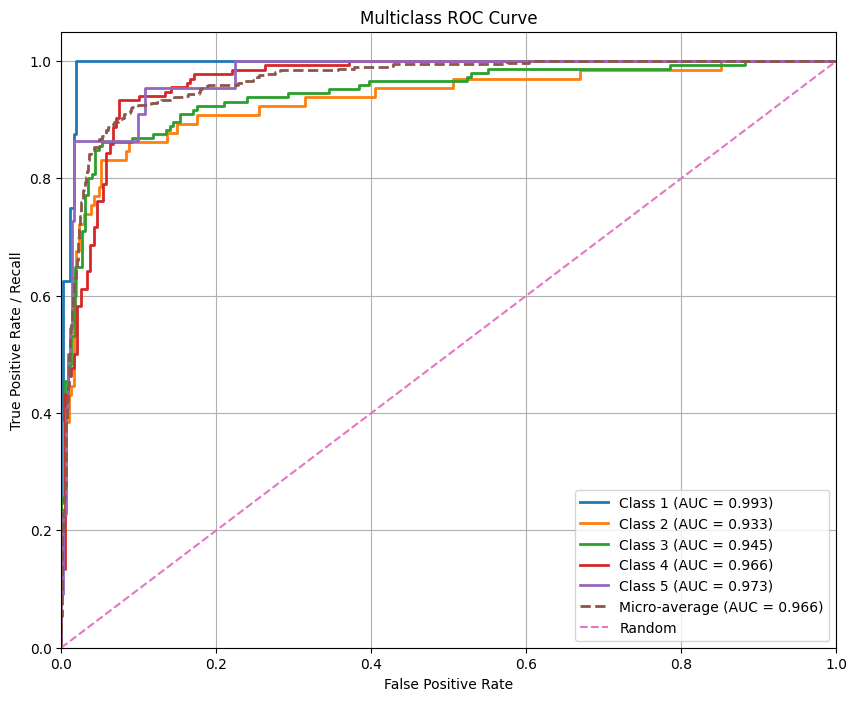

In [256]:
#Plot combined ROC curves

plt.figure(figsize=(10, 8))

for cls in classes:
    plt.plot(
        fpr[cls],
        tpr[cls],
        linewidth=2,
        label=f"Class {cls} (AUC = {roc_auc[cls]:.3f})"
    )

plt.plot(
    fpr["micro"],
    tpr["micro"],
    linestyle="--",
    linewidth=2,
    label=f"Micro-average (AUC = {roc_auc['micro']:.3f})"
)

plt.plot([0, 1], [0, 1], linestyle="--", label="Random")

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate / Recall")
plt.title("Multiclass ROC Curve")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

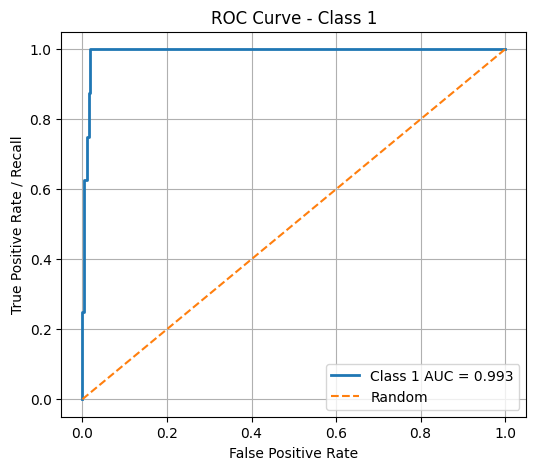

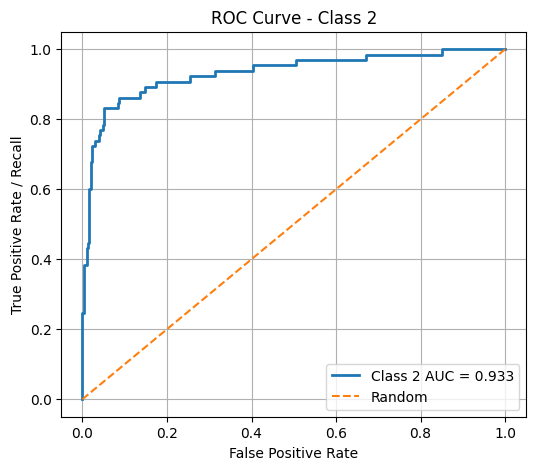

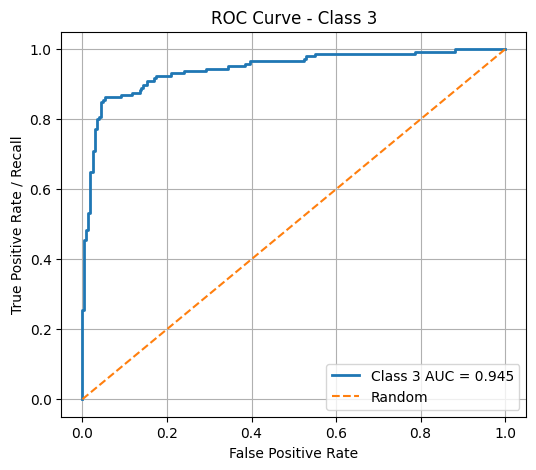

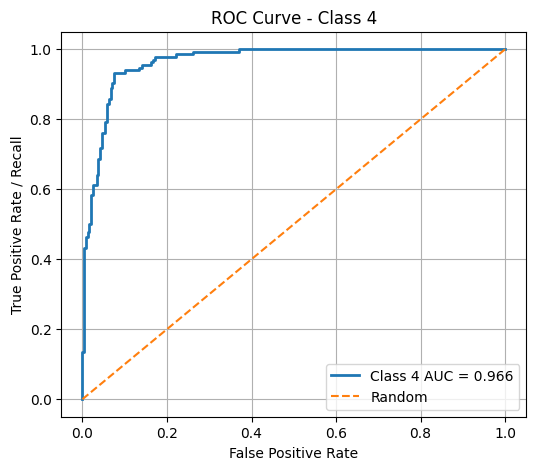

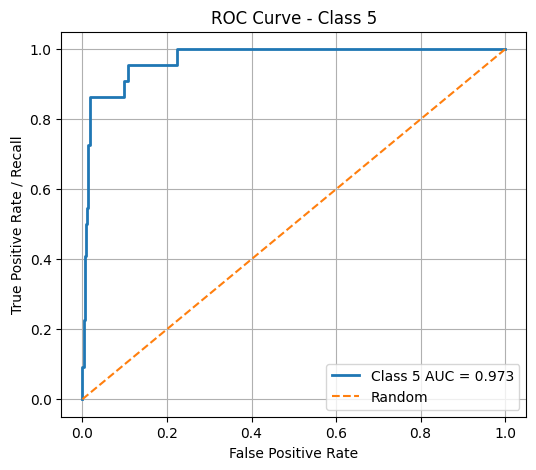

In [257]:
for cls in classes:
    plt.figure(figsize=(6, 5))
    plt.plot(fpr[cls], tpr[cls], linewidth=2, label=f"Class {cls} AUC = {roc_auc[cls]:.3f}")
    plt.plot([0, 1], [0, 1], linestyle="--", label="Random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate / Recall")
    plt.title(f"ROC Curve - Class {cls}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

In [258]:
# find all wrong prediction  on test
import pandas as pd

results = X_test.copy()
results["actual"] = y_test
results["predicted"] = pred

wrong_predictions = results[results["actual"] != results["predicted"]]
wrong_predictions.to_csv("wrong_predictions.csv", index=False)

print(len(wrong_predictions))
# find false negative 
false_negative_class1 = results[(results["actual"] == 1) & (results["predicted"] != 1)]

print(false_negative_class1)

print(f"Predicted values:\n{results['predicted'].value_counts()}")

54
     Chief_complain_clean         SBP        DBP         HR    RR    BT  \
1019               arrest  133.648953  79.780291  83.963111  20.0  36.5   

      NRS_pain  Age  Sex  KTAS_RN  actual  predicted  
1019  4.104079   63    1        1       1          4  
Predicted values:
predicted
4    142
3    130
2     57
5     31
1     14
Name: count, dtype: int64


In [259]:
results = X_test.copy()
results["actual"] = y_test
results["predicted"] = pred

wrong_predictions = results[results["actual"] != results["predicted"]]
wrong_predictions.to_csv("wrong_predictions.csv", index=False)

print(len(wrong_predictions))
# find false negative 
false_negative_class1 = results[(results["actual"] == 2) & (results["predicted"] != 2)]

print(false_negative_class1)

print(f"Predicted values:\n{results['predicted'].value_counts()}")

54
     Chief_complain_clean         SBP         DBP          HR    RR    BT  \
44          mental change  110.000000   70.000000   68.000000  20.0  36.4   
805               dyspnea  116.000000   85.000000  112.000000  28.0  37.0   
176       erection penile  133.648953   79.780291   83.963111  20.0  36.5   
538               dyspnea  140.000000   90.000000   64.000000  22.0  36.4   
121      general weakness  214.000000   95.000000   66.000000  20.0  37.2   
88             wrist pain  100.000000   60.000000   64.000000  18.0  36.6   
370               dyspnea  110.000000   70.000000   67.000000  20.0  36.0   
53        left chest pain  110.000000   70.000000   92.000000  20.0  36.7   
1184               melena   70.000000   40.000000   82.000000  20.0  36.3   
125           fever chill  143.000000   70.000000  130.000000  20.0  38.1   
148         mental change  110.000000   70.000000  140.000000  24.0  36.2   
130               dyspnea  150.000000   90.000000  110.000000  26.0  36.5

In [260]:
def predict_new_patient(model, patient_df, threshold_class_1=0.30, threshold_class_2=0.40):
    probs = model.predict_proba(patient_df)
    classes = model.named_steps["clf"].classes_
    class_to_index = {cls: idx for idx, cls in enumerate(classes)}

    idx1 = class_to_index[1]
    idx2 = class_to_index[2]

    predictions = []

    for row in probs:
        if row[idx1] >= threshold_class_1:
            predictions.append(1)
        elif row[idx2] >= threshold_class_2:
            predictions.append(2)
        else:
            predictions.append(classes[np.argmax(row)])

    return np.array(predictions), probs

In [261]:
new_patients = pd.DataFrame([
      {
        "Chief_complain_clean": "mental change",
        "SBP": 65,
        "DBP": 35,
        "HR": 138,
        "RR": 34,
        "BT": 36.0,
        "NRS_pain": 9,
        "Age": 67,
        "Sex": 1,
        "KTAS_RN": np.nan
    }])



preds, probs = predict_new_patient(model, new_patients)

print("Final prediction:", preds[0])
print("Probabilities:", dict(zip(model.named_steps["clf"].classes_, probs[0])))

Final prediction: 1
Probabilities: {np.int64(1): np.float64(0.40215235939271865), np.int64(2): np.float64(0.39639704182647634), np.int64(3): np.float64(0.0867471758837431), np.int64(4): np.float64(0.05360243509291957), np.int64(5): np.float64(0.06110098780414229)}


In [262]:
import pandas as pd

def obstetric_rule_override(row):
    text = str(row.get("Chief_complain_clean", "")).lower()

    pregnant = row.get("Pregnant", 0) == 1

    sbp = row.get("SBP", None)
    rr = row.get("RR", None)
    hr = row.get("HR", None)

    # text flags
    has_bleeding = any(k in text for k in [
        "vaginal bleeding", "bleeding", "heavy bleeding"
    ])
    has_headache = any(k in text for k in [
        "severe headache", "headache"
    ])
    has_blur = any(k in text for k in [
        "blurred vision", "vision blur", "vision_blur"
    ])
    has_abd_pain = any(k in text for k in [
        "abdominal pain", "abd pain", "epigastric pain"
    ])
    has_no_fetal_movement = any(k in text for k in [
        "no fetal movement", "reduced fetal movement", "decreased fetal movement"
    ])
    has_labor = any(k in text for k in [
        "contractions", "labor", "labour"
    ])
    has_prolapse = any(k in text for k in [
        "cord prolapse", "prolapsed cord", "presenting fetal parts"
    ])

    
    # CTAS 1 obstetric override
   
    if pregnant:
        # obvious obstetric level-1 patterns
        if has_prolapse:
            return 1

        # very unstable vitals / collapse pattern
        if sbp is not None and pd.notna(sbp) and sbp < 80:
            return 1
        if rr is not None and pd.notna(rr) and rr > 30:
            return 1
        if hr is not None and pd.notna(hr) and hr > 130:
            return 1

        # you can add trimester logic here if available:
        # if row.get("Trimester", None) == 3 and has_bleeding:
        #     return 1

   
    # CTAS 2 obstetric override
   
    if pregnant:
        if has_no_fetal_movement:
            return 2

        if has_headache and has_blur:
            return 2

        if has_headache and sbp is not None and pd.notna(sbp) and sbp >= 140:
            return 2

        if has_abd_pain:
            return 2

        if has_bleeding:
            return 2

        if has_labor:
            return 2

    return None

In [263]:
import numpy as np
import pandas as pd

def clinical_rule_override(row):
    text_raw = row.get("Chief_complain_clean", "")
    text = "" if pd.isna(text_raw) else str(text_raw).lower()

    sbp = row.get("SBP", np.nan)
    hr = row.get("HR", np.nan)
    rr = row.get("RR", np.nan)
    pain = row.get("NRS_pain", np.nan)

    altered_mental = any(k in text for k in [
        "mental change", "altered mental", "confused", "unresponsive"
    ])
    seizure = any(k in text for k in [
        "seizure", "convulsion", "fits"
    ])
    severe_resp = any(k in text for k in [
        "cannot breathe", "not breathing", "severe shortness of breath", "respiratory distress"
    ])
    chest_pain = any(k in text for k in [
        "chest pain", "crushing chest pain", "heavy chest pain"
    ])
    shortness_breath = any(k in text for k in [
        "shortness of breath", "sob", "breathing difficulty"
    ])
    major_bleeding = any(k in text for k in [
        "massive bleeding", "heavy bleeding", "profuse bleeding"
    ])

    # CTAS 1
    if altered_mental:
        return 1
    if seizure:
        return 1
    if severe_resp:
        return 1
    if major_bleeding:
        return 1
    if pd.notna(sbp) and sbp < 80:
        return 1
    if pd.notna(hr) and hr > 130:
        return 1
    if pd.notna(rr) and rr > 30:
        return 1

    # CTAS 2
    if chest_pain:
        return 2
    if shortness_breath:
        return 2
    if pd.notna(pain) and pain >= 8:
        return 2
    if pd.notna(sbp) and 80 <= sbp < 90:
        return 2
    if pd.notna(hr) and 110 <= hr <= 130:
        return 2
    if pd.notna(rr) and 24 <= rr <= 30:
        return 2

    return None

In [264]:
def combined_rule_override(row):
    preg_pred = obstetric_rule_override(row)
    clinical_pred = clinical_rule_override(row)

    rule_preds = [p for p in [preg_pred, clinical_pred] if p is not None]

    if len(rule_preds) == 0:
        return None

    # lower CTAS number = higher urgency
    return min(rule_preds)

In [265]:
import numpy as np
import pandas as pd

def predict_with_all_rules(model, patient_df, threshold_class_1=0.30, threshold_class_2=0.40):
    classes = model.named_steps["clf"].classes_
    class_to_index = {cls: idx for idx, cls in enumerate(classes)}
    idx1 = class_to_index[1]
    idx2 = class_to_index[2]

    default_preds = model.predict(patient_df)
    probs = model.predict_proba(patient_df)

    tuned_preds = []
    preg_preds = []
    clinical_preds = []
    combined_preds = []
    final_preds = []
    final_source = []

    for i, row in patient_df.iterrows():
        p = probs[i]

        # threshold-tuned model
        if p[idx1] >= threshold_class_1:
            tuned_pred = 1
        elif p[idx2] >= threshold_class_2:
            tuned_pred = 2
        else:
            tuned_pred = classes[np.argmax(p)]

        tuned_preds.append(tuned_pred)

        # rules
        preg_pred = obstetric_rule_override(row)
        clin_pred = clinical_rule_override(row)
        comb_pred = combined_rule_override(row)

        preg_preds.append(preg_pred)
        clinical_preds.append(clin_pred)
        combined_preds.append(comb_pred)

        # final prediction
        if comb_pred is not None:
            final_preds.append(comb_pred)
            final_source.append("rule_override")
        else:
            final_preds.append(tuned_pred)
            final_source.append("model_tuned")

    result_df = patient_df.copy()
    result_df["Pregnancy_Rule_CTAS"] = preg_preds
    result_df["Clinical_Rule_CTAS"] = clinical_preds
    result_df["Combined_Rule_CTAS"] = combined_preds
    result_df["Model_Default_CTAS"] = default_preds
    result_df["Model_Tuned_CTAS"] = tuned_preds
    result_df["Final_CTAS"] = final_preds
    result_df["Final_Source"] = final_source

    for i, cls in enumerate(classes):
        result_df[f"Prob_Class_{cls}"] = np.round(probs[:, i], 4)

    return result_df

In [266]:
new_patients = pd.DataFrame([
      {
        "Chief_complain_clean": "fever and cough shortness of breath",
        "SBP": 115,
        "DBP": 80,
        "HR": 110,
        "RR": 30,
        "BT": 36.8,
        "NRS_pain": 5,
        "Age": 58,
        "Sex": 1,
        "KTAS_RN": np.nan,
        "pregnant": 1
      }
])

In [267]:
result_df = predict_with_all_rules(
    model,
    new_patients,
    threshold_class_1=0.30,
    threshold_class_2=0.40
)

print(result_df)



                  Chief_complain_clean  SBP  DBP   HR  RR    BT  NRS_pain  \
0  fever and cough shortness of breath  115   80  110  30  36.8         5   

   Age  Sex  KTAS_RN  pregnant Pregnancy_Rule_CTAS  Clinical_Rule_CTAS  \
0   58    1      NaN         1                None                   2   

   Combined_Rule_CTAS  Model_Default_CTAS  Model_Tuned_CTAS  Final_CTAS  \
0                   2                   3                 3           2   

    Final_Source  Prob_Class_1  Prob_Class_2  Prob_Class_3  Prob_Class_4  \
0  rule_override        0.0527        0.2405        0.2469        0.2253   

   Prob_Class_5  
0        0.2346  


In [268]:
# result_df = predict_with_obstetric_override(
#     model,
#     new_patients,
#     threshold_class_1=0.30,
#     threshold_class_2=0.40
# )

# print(result_df)

In [269]:


    # Save pickle — bundle model + helper functions in a dict
bundle = {
        "model":                    model,
        "threshold_class_1":        threshold_class_1,
        "threshold_class_2":        threshold_class_2,
        "predict_with_all_rules":   predict_with_all_rules,
        "obstetric_rule_override":  obstetric_rule_override,
        "clinical_rule_override":   clinical_rule_override,
        "combined_rule_override":   combined_rule_override,
        "clean_text_func":          clean_text_func,
    }
with open("model_by_kp.pkl", "wb") as file:
    pickle.dump(bundle, file)

print("Model saved successfully")
 


Model saved successfully
